<a href="https://colab.research.google.com/github/anushkayeole24/Innomatics-Data-Science-Internship/blob/main/EDAProject.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

**EDA Project = Analysis of AMCAT Dataset**

Description :
The dataset was released by Aspiring Minds from the Aspiring Mind Employment Outcome 2015 (AMEO). The study is primarily limited  only to students with engineering disciplines. The dataset contains the employment outcomes of engineering graduates as dependent variables (Salary, Job Titles, and Job Locations) along with the standardized scores from three different areas – cognitive skills, technical skills and personality skills. The dataset also contains demographic features. The dataset  contains  around  40 independent variables and 4000 data points. The independent variables are both continuous and categorical in nature. The dataset contains a unique identifier for each candidate. Below mentioned table contains the details for the original dataset.  


Objective :
The Exploratory Data Analysis of AMCAT project is to gain a comprehensive understanding of the dataset through visualizations, statistical summaries, and pattern recognition. By exploring the data in depth, we aim to identify trends, anomalies, and relationships within the dataset, which will inform subsequent analystical decisions, hypothesis formulation, and feature engineering.
Additionally, EDA helps in uncovering potential data quality issues, outliers, and missing values, enabling us to prepare the data appropriately for further analysis or modeling.
Ultimately, this EDA project serves as a crucial initial step in extracting actionable insights, guiding decision making processes, and deriving value from the underlying data.

In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn import svm
import warnings

In [3]:
from google.colab import drive

In [4]:
drive.mount('/content/drive')

Mounted at /content/drive


In [5]:
df = pd.read_csv("/content/drive/MyDrive/data.xlsx - Sheet1.csv")

In [6]:
df.shape

(3998, 39)

In [ ]:
df.head()

,Unnamed: 0,ID,Salary,DOJ,DOL,Designation,JobCity,Gender,DOB,10percentage,...,ComputerScience,MechanicalEngg,ElectricalEngg,TelecomEngg,CivilEngg,conscientiousness,agreeableness,extraversion,nueroticism,openess_to_experience
0,train,203097,420000.0,6/1/12 0:00,present,senior quality engineer,Bangalore,f,2/19/90 0:00,84.3,...,-1,-1,-1,-1,-1,0.9737,0.8128,0.5269,1.35490,-0.4455
1,train,579905,500000.0,9/1/13 0:00,present,assistant manager,Indore,m,10/4/89 0:00,85.4,...,-1,-1,-1,-1,-1,-0.7335,0.3789,1.2396,-0.10760,0.8637
2,train,810601,325000.0,6/1/14 0:00,present,systems engineer,Chennai,f,8/3/92 0:00,85.0,...,-1,-1,-1,-1,-1,0.2718,1.7109,0.1637,-0.86820,0.6721
3,train,267447,1100000.0,7/1/11 0:00,present,senior software engineer,Gurgaon,m,12/5/89 0:00,85.6,...,-1,-1,-1,-1,-1,0.0464,0.3448,-0.3440,-0.40780,-0.9194
4,train,343523,200000.0,3/1/14 0:00,3/1/15 0:00,get,Manesar,m,2/27/91 0:00,78.0,...,-1,-1,-1,-1,-1,-0.8810,-0.2793,-1.0697,0.09163,-0.1295


In [ ]:
df.columns

Index(['Unnamed: 0', 'ID', 'Salary', 'DOJ', 'DOL', 'Designation', 'JobCity',
       'Gender', 'DOB', '10percentage', '10board', '12graduation',
       '12percentage', '12board', 'CollegeID', 'CollegeTier', 'Degree',
       'Specialization', 'collegeGPA', 'CollegeCityID', 'CollegeCityTier',
       'CollegeState', 'GraduationYear', 'English', 'Logical', 'Quant',
       'Domain', 'ComputerProgramming', 'ElectronicsAndSemicon',
       'ComputerScience', 'MechanicalEngg', 'ElectricalEngg', 'TelecomEngg',
       'CivilEngg', 'conscientiousness', 'agreeableness', 'extraversion',
       'nueroticism', 'openess_to_experience'],
      dtype='object')

In [ ]:
df.columns = df.columns.str.strip()
df.columns

Index(['Unnamed: 0', 'ID', 'Salary', 'DOJ', 'DOL', 'Designation', 'JobCity',
       'Gender', 'DOB', '10percentage', '10board', '12graduation',
       '12percentage', '12board', 'CollegeID', 'CollegeTier', 'Degree',
       'Specialization', 'collegeGPA', 'CollegeCityID', 'CollegeCityTier',
       'CollegeState', 'GraduationYear', 'English', 'Logical', 'Quant',
       'Domain', 'ComputerProgramming', 'ElectronicsAndSemicon',
       'ComputerScience', 'MechanicalEngg', 'ElectricalEngg', 'TelecomEngg',
       'CivilEngg', 'conscientiousness', 'agreeableness', 'extraversion',
       'nueroticism', 'openess_to_experience'],
      dtype='object')

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3998 entries, 0 to 3997
Data columns (total 39 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   Unnamed: 0             3998 non-null   object 
 1   ID                     3998 non-null   int64  
 2   Salary                 3998 non-null   float64
 3   DOJ                    3998 non-null   object 
 4   DOL                    3998 non-null   object 
 5   Designation            3998 non-null   object 
 6   JobCity                3998 non-null   object 
 7   Gender                 3998 non-null   object 
 8   DOB                    3998 non-null   object 
 9   10percentage           3998 non-null   float64
 10  10board                3998 non-null   object 
 11  12graduation           3998 non-null   int64  
 12  12percentage           3998 non-null   float64
 13  12board                3998 non-null   object 
 14  CollegeID              3998 non-null   int64  
 15  Coll

In [ ]:
#missing values in the dataset
missing_values = df.isnull().sum()
for column, count in missing_values.items():
    if count > 0:
        print(f"Column '{column}' has {count} missing value(s).")
total_missing = missing_values.sum()
print(f"Total missing values in the dataset: {total_missing}")


Total missing values in the dataset: 0


There are no missing values to be found in the given dataset.

Converting the datatype of some specified column into datetime datatype as they were in object datatype.

In [ ]:
df['DOJ'] = pd.to_datetime(df['DOJ'])
df['DOB'] = pd.to_datetime(df['DOB'])


In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3998 entries, 0 to 3997
Data columns (total 39 columns):
 #   Column                 Non-Null Count  Dtype         
---  ------                 --------------  -----         
 0   Unnamed: 0             3998 non-null   object        
 1   ID                     3998 non-null   int64         
 2   Salary                 3998 non-null   float64       
 3   DOJ                    3998 non-null   datetime64[ns]
 4   DOL                    3998 non-null   object        
 5   Designation            3998 non-null   object        
 6   JobCity                3998 non-null   object        
 7   Gender                 3998 non-null   object        
 8   DOB                    3998 non-null   datetime64[ns]
 9   10percentage           3998 non-null   float64       
 10  10board                3998 non-null   object        
 11  12graduation           3998 non-null   int64         
 12  12percentage           3998 non-null   float64       
 13  12b

In [ ]:
from datetime import datetime
current_date = datetime.now()

In [ ]:
df['DOL'] = df['DOL'].apply(lambda x: current_date if x == 'present' else x)
# Convert the 'DOL' column to datetime
df['DOL'] = pd.to_datetime(df['DOL'])

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3998 entries, 0 to 3997
Data columns (total 39 columns):
 #   Column                 Non-Null Count  Dtype         
---  ------                 --------------  -----         
 0   Unnamed: 0             3998 non-null   object        
 1   ID                     3998 non-null   int64         
 2   Salary                 3998 non-null   float64       
 3   DOJ                    3998 non-null   datetime64[ns]
 4   DOL                    3998 non-null   datetime64[ns]
 5   Designation            3998 non-null   object        
 6   JobCity                3998 non-null   object        
 7   Gender                 3998 non-null   object        
 8   DOB                    3998 non-null   datetime64[ns]
 9   10percentage           3998 non-null   float64       
 10  10board                3998 non-null   object        
 11  12graduation           3998 non-null   int64         
 12  12percentage           3998 non-null   float64       
 13  12b

In [ ]:
#Univariate Analysis (Statistical Non Visual Analysis)

We will perform statistical analysis on the dataset.  

In [ ]:
discrete_df = df.select_dtypes(include=['object'])

numerical_df = df.select_dtypes(include=['int64', 'float64'])

In [ ]:
def discrete_univariate_analysis(discrete_data):
    for col_name in discrete_data:
        print("*"*10, col_name, "*"*10)
        print(discrete_data[col_name].agg(['count', 'nunique', 'unique']))
        print('Value Counts: \n', discrete_data[col_name].value_counts())
        print()

In [ ]:
discrete_univariate_analysis(discrete_df)

********** Unnamed: 0 **********
count         3998
nunique          1
unique     [train]
Name: Unnamed: 0, dtype: object
Value Counts: 
 train    3998
Name: Unnamed: 0, dtype: int64

********** Designation **********
count                                                   3998
nunique                                                  419
unique     [senior quality engineer, assistant manager, s...
Name: Designation, dtype: object
Value Counts: 
 software engineer                    539
software developer                   265
system engineer                      205
programmer analyst                   139
systems engineer                     118
                                    ... 
cad drafter                            1
noc engineer                           1
human resources intern                 1
senior quality assurance engineer      1
jr. software developer                 1
Name: Designation, Length: 419, dtype: int64

********** JobCity **********
count                  

We have count the Unique and nuniue values for all the categorical columns in the data.

In [ ]:
def numerical_univariate_analysis(numerical_data):
    for col_name in numerical_data:
        print("*"*10, col_name, "*"*10)
        print(numerical_data[col_name].agg(['min', 'max', 'mean', 'median', 'std']))
        print()

In [ ]:
numerical_univariate_analysis(numerical_df)

********** ID **********
min       1.124400e+04
max       1.298275e+06
mean      6.637945e+05
median    6.396000e+05
std       3.632182e+05
Name: ID, dtype: float64

********** Salary **********
min       3.500000e+04
max       4.000000e+06
mean      3.076998e+05
median    3.000000e+05
std       2.127375e+05
Name: Salary, dtype: float64

********** 10percentage **********
min       43.000000
max       97.760000
mean      77.925443
median    79.150000
std        9.850162
Name: 10percentage, dtype: float64

********** 12graduation **********
min       1995.000000
max       2013.000000
mean      2008.087544
median    2008.000000
std          1.653599
Name: 12graduation, dtype: float64

********** 12percentage **********
min       40.000000
max       98.700000
mean      74.466366
median    74.400000
std       10.999933
Name: 12percentage, dtype: float64

********** CollegeID **********
min           2.000000
max       18409.000000
mean       5156.851426
median     3879.000000
std        48

In numerical_univariate_analysis we have calculated min, max, mean, median, std of each numerical column in the data.

In [ ]:
numerical_df.columns

Index(['ID', 'Salary', '10percentage', '12graduation', '12percentage',
       'CollegeID', 'CollegeTier', 'collegeGPA', 'CollegeCityID',
       'CollegeCityTier', 'GraduationYear', 'English', 'Logical', 'Quant',
       'Domain', 'ComputerProgramming', 'ElectronicsAndSemicon',
       'ComputerScience', 'MechanicalEngg', 'ElectricalEngg', 'TelecomEngg',
       'CivilEngg', 'conscientiousness', 'agreeableness', 'extraversion',
       'nueroticism', 'openess_to_experience'],
      dtype='object')

In [ ]:
discrete_num_cols = ['ID', '12graduation','CollegeID', 'CollegeTier', 'CollegeCityID',
                   'CollegeCityTier', 'GraduationYear']

In [ ]:
numerical_df.drop(columns=discrete_num_cols, axis=1, inplace=True)
print('Shape:', numerical_df.shape)
print('Columns:', numerical_df.columns)

Shape: (3998, 20)
Columns: Index(['Salary', '10percentage', '12percentage', 'collegeGPA', 'English',
       'Logical', 'Quant', 'Domain', 'ComputerProgramming',
       'ElectronicsAndSemicon', 'ComputerScience', 'MechanicalEngg',
       'ElectricalEngg', 'TelecomEngg', 'CivilEngg', 'conscientiousness',
       'agreeableness', 'extraversion', 'nueroticism',
       'openess_to_experience'],
      dtype='object')


Below we will analyse the numerical as well as categorical column by droping some columns and then we will perform again count categorical columns and calculate min, max, median, std, median for those new formed columns.

In [ ]:
discrete_num_df = df[discrete_num_cols]
print('Shape:', discrete_num_df.shape)
print('Columns:', discrete_num_df.columns)

Shape: (3998, 7)
Columns: Index(['ID', '12graduation', 'CollegeID', 'CollegeTier', 'CollegeCityID',
       'CollegeCityTier', 'GraduationYear'],
      dtype='object')


In [ ]:
discrete_num_df = discrete_num_df.drop(columns=['ID'], axis=1)

print('Shape:', discrete_num_df.shape)
print('Columns:', list(discrete_num_df.columns))

Shape: (3998, 6)
Columns: ['12graduation', 'CollegeID', 'CollegeTier', 'CollegeCityID', 'CollegeCityTier', 'GraduationYear']


In [ ]:
numerical_univariate_analysis(numerical_df)

********** Salary **********
min       3.500000e+04
max       4.000000e+06
mean      3.076998e+05
median    3.000000e+05
std       2.127375e+05
Name: Salary, dtype: float64

********** 10percentage **********
min       43.000000
max       97.760000
mean      77.925443
median    79.150000
std        9.850162
Name: 10percentage, dtype: float64

********** 12percentage **********
min       40.000000
max       98.700000
mean      74.466366
median    74.400000
std       10.999933
Name: 12percentage, dtype: float64

********** collegeGPA **********
min        6.450000
max       99.930000
mean      71.486171
median    71.720000
std        8.167338
Name: collegeGPA, dtype: float64

********** English **********
min       180.000000
max       875.000000
mean      501.649075
median    500.000000
std       104.940021
Name: English, dtype: float64

********** Logical **********
min       195.000000
max       795.000000
mean      501.598799
median    505.000000
std        86.783297
Name: Logical, d

In [ ]:
discrete_univariate_analysis(discrete_df)

********** Unnamed: 0 **********
count         3998
nunique          1
unique     [train]
Name: Unnamed: 0, dtype: object
Value Counts: 
 train    3998
Name: Unnamed: 0, dtype: int64

********** Designation **********
count                                                   3998
nunique                                                  419
unique     [senior quality engineer, assistant manager, s...
Name: Designation, dtype: object
Value Counts: 
 software engineer                    539
software developer                   265
system engineer                      205
programmer analyst                   139
systems engineer                     118
                                    ... 
cad drafter                            1
noc engineer                           1
human resources intern                 1
senior quality assurance engineer      1
jr. software developer                 1
Name: Designation, Length: 419, dtype: int64

********** JobCity **********
count                  

In [ ]:
discrete_univariate_analysis(discrete_num_df)

********** 12graduation **********
count                                                   3998
nunique                                                   16
unique     [2007, 2010, 2008, 2009, 2006, 2011, 2005, 199...
Name: 12graduation, dtype: object
Value Counts: 
 2009    1052
2008     935
2010     742
2007     528
2006     407
2005     160
2004      73
2011      46
2003      25
2002      14
2012      10
2001       2
1995       1
1998       1
2013       1
1999       1
Name: 12graduation, dtype: int64

********** CollegeID **********
count                                                   3998
nunique                                                 1350
unique     [1141, 5807, 64, 6920, 11368, 5086, 314, 1757,...
Name: CollegeID, dtype: object
Value Counts: 
 272      94
64       38
11759    35
44       35
47       33
         ..
128       1
5068      1
8637      1
9361      1
4883      1
Name: CollegeID, Length: 1350, dtype: int64

********** CollegeTier **********
count        3998

In [ ]:
df[discrete_num_cols] = df[discrete_num_cols].astype('object')

df.info()


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3998 entries, 0 to 3997
Data columns (total 39 columns):
 #   Column                 Non-Null Count  Dtype         
---  ------                 --------------  -----         
 0   Unnamed: 0             3998 non-null   object        
 1   ID                     3998 non-null   object        
 2   Salary                 3998 non-null   float64       
 3   DOJ                    3998 non-null   datetime64[ns]
 4   DOL                    3998 non-null   datetime64[ns]
 5   Designation            3998 non-null   object        
 6   JobCity                3998 non-null   object        
 7   Gender                 3998 non-null   object        
 8   DOB                    3998 non-null   datetime64[ns]
 9   10percentage           3998 non-null   float64       
 10  10board                3998 non-null   object        
 11  12graduation           3998 non-null   object        
 12  12percentage           3998 non-null   float64       
 13  12b

In [ ]:
#Univariate - Visual Analysis

In [ ]:
df.shape

(3998, 39)

array([[<Axes: ylabel='Frequency'>, <Axes: ylabel='Frequency'>,
        <Axes: ylabel='Frequency'>, <Axes: ylabel='Frequency'>],
       [<Axes: ylabel='Frequency'>, <Axes: ylabel='Frequency'>,
        <Axes: ylabel='Frequency'>, <Axes: ylabel='Frequency'>],
       [<Axes: ylabel='Frequency'>, <Axes: ylabel='Frequency'>,
        <Axes: ylabel='Frequency'>, <Axes: ylabel='Frequency'>],
       [<Axes: ylabel='Frequency'>, <Axes: ylabel='Frequency'>,
        <Axes: ylabel='Frequency'>, <Axes: ylabel='Frequency'>],
       [<Axes: ylabel='Frequency'>, <Axes: ylabel='Frequency'>,
        <Axes: ylabel='Frequency'>, <Axes: ylabel='Frequency'>]],
      dtype=object)

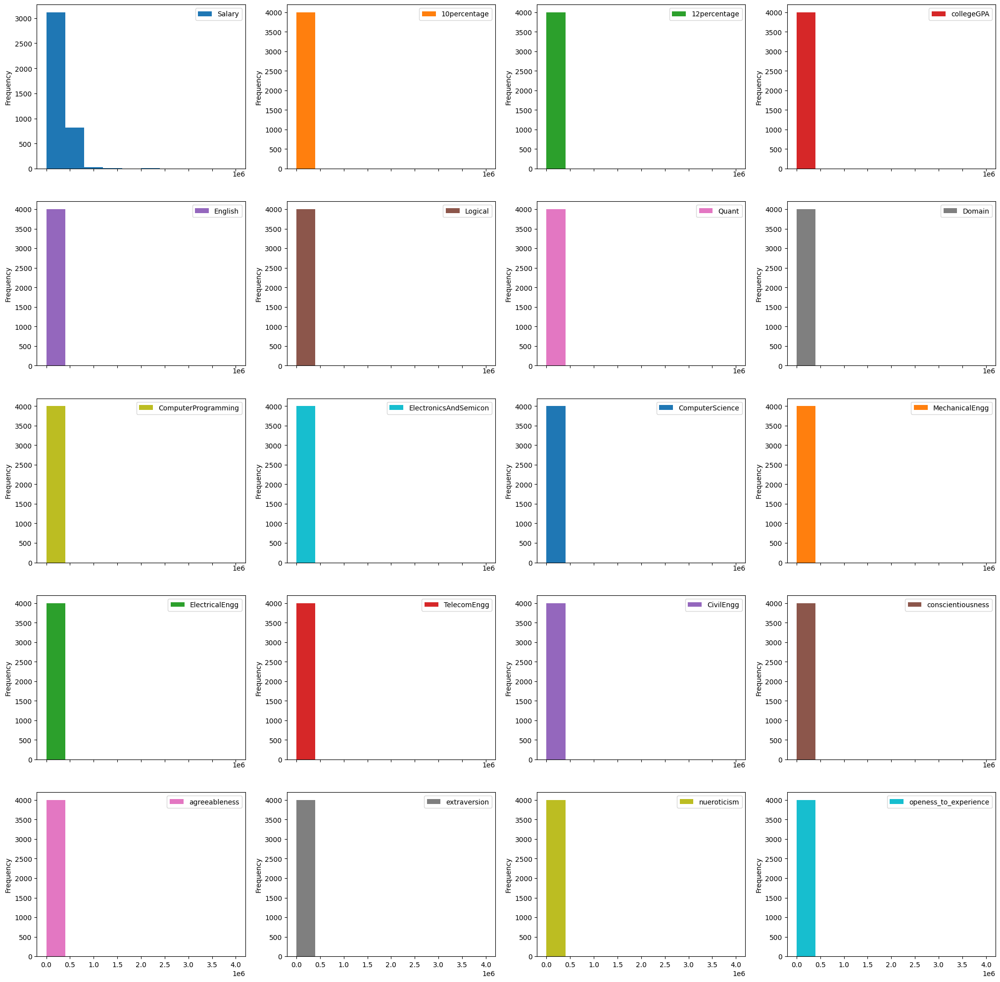

In [ ]:
df.plot(kind='hist', subplots=True, layout=(5, 4), figsize=(25, 25))

The above plot is a histogram of each numerical column in the amcat data. The above diagram is plot in a subplot form with x Axes as the name of {col} and y Axes as the frequency. The above Plot explains the data we have in the Amcat dataset.

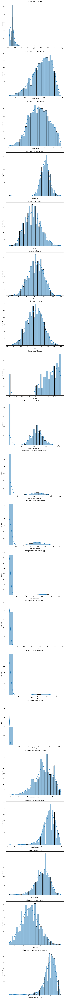

In [ ]:
# it is for Histogram plots
# Specify the columns you want to include in the analysis
numerical_columns = ['Salary','10percentage','12percentage','collegeGPA', 'English', 'Logical', 'Quant',
       'Domain', 'ComputerProgramming', 'ElectronicsAndSemicon',
       'ComputerScience', 'MechanicalEngg', 'ElectricalEngg', 'TelecomEngg',
       'CivilEngg', 'conscientiousness', 'agreeableness', 'extraversion',
       'nueroticism', 'openess_to_experience']
# Plot histograms for specific numerical columns using subplots
fig, axes = plt.subplots(nrows=len(numerical_columns), ncols=1, figsize=(8, 6 * len(numerical_columns)))

for idx, col in enumerate(numerical_columns):
    sns.histplot(df[col], kde=True, ax=axes[idx])
    axes[idx].set_title(f'Histogram of {col}')
    axes[idx].set_xlabel(col)
    axes[idx].set_ylabel('Frequency')

plt.tight_layout()
plt.show()

The above plot are univariate analysis using histogram plot. We had plotted graph of variations for the numerical columns.

The observation for all the Histograms :    

1.   Histogram of Salary :
*   Distribution Shape : Positively Skewed
*   Variability : The lowest salary range is 30,000 and the highest salary range is 40,00,000 lakhs and the histogram is wide.
*   Outliers = 109

2.   Histogram of 10Percentage :
*   Distribution Shape : Negatively Skewed
* This had a wider range but has increased on the right side of the graph. The highest range could be around 280 frequency as in (average students number) who had scored around 89 percentage.
*   Outliers = 30


3.   Histogram of 12Percentage :       
*   Distribution Shape : Negatively Skewed
* We could say that this is a uniform distribution but still as the graph has gone up in the right side. Makes it negatively skewed. The highest range lies between 70%.
*   Outliers = 45  

4.   Histogram of collegeGPA :
*   Distribution Shape : Negatively Skewed
* The collegeGPA score has also increased on the right side. Highest range is around 70% among the Average 280 no. of students.
*   Outliers = 38  


5.   Histogram of English :
*   Distribution Shape : Zero Skewed
*   Outliers = 15


6.   Histogram of Logical :
*   Distribution Shape : Zero Skewed
*   Outliers = 18

7.   Histogram of Quant :
*   Distribution Shape : Zero Skewed
*   Outliers = 25

8.   Histogram of Domain :
*   Distribution Shape : Unimodal Skewed
*   Outliers = 246

@Even though we have seen the range of students passing in english, quant, logical is the normal distribution. But we can see the fall of score of students passing in Domain has taken a different shape. It has shifted to almost the corner of right which is good score amongst the students. But the score also contains failed candidates. As too for ComputerProgramming, ElectronicsAndSemicon, and so on.

9.   Histogram of ComputerProgramming :
*   Distribution Shape : Uniform Distribution
*   Outliers = 2

10.  Histogram of ElectronicsAndSemicon :
*   Distribution Shape : Zero Skewed
*   Outliers = 2

11.  Histogram of ComputerScience :
*   Distribution Shape : Zero Skewed
*   Outliers = 902

12.  Histogram of MechanicalEngg :
*   Distribution Shape : Zero Skewed
*   Outliers = 235

13.  Histogram of ElectricalEngg :
*   Distribution Shape : Zero Skewed
*   Outliers = 161

14.  Histogram of TelecomEngg :
*   Distribution Shape : Zero Skewed
*   Outliers = 374

15.  Histogram of CivilEngg :
*   Distribution Shape : Zero Skewed
*   Outliers = 42
$ In all the Engineering subjects we have seen a great fall of passing students and the no. of students who had failed has increased by 4 times in every graph as compared to the passing.

16.  Histogram of conscientiousness :
*   Distribution Shape : left Skewed
*   Outliers = 39

17.  Histogram of agreeableness :
*   Distribution Shape : left Skewed
*   Outliers = 123

18.  Histogram of extraversion :
*   Distribution Shape : left Skewed
*   Outliers = 40

19.  Histogram of nueroticism :
*   Distribution Shape : uniformly Skewed
*   Outliers = 15

20.  Histogram of openess_to_experience :
*   Distribution Shape : left Skewed
*   Outliers = 95

$ All the personality trait column graphs had shown the great wider variation.

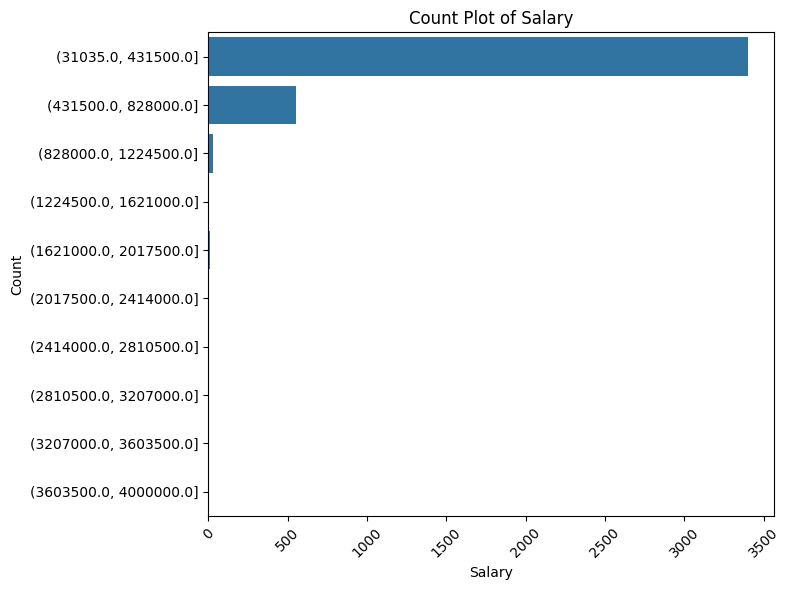

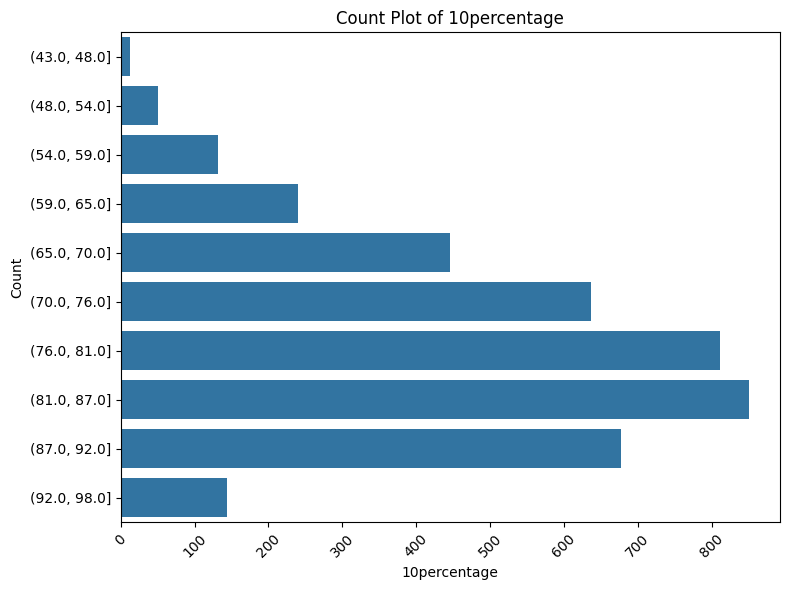

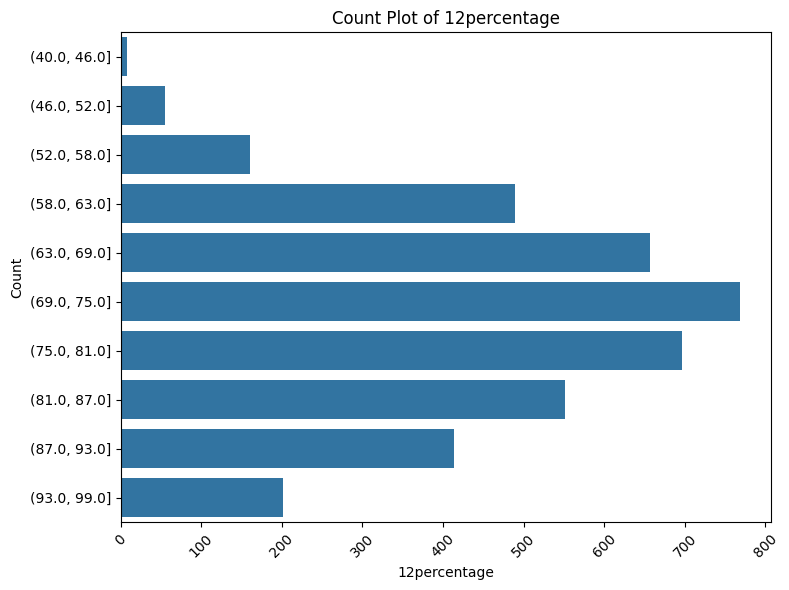

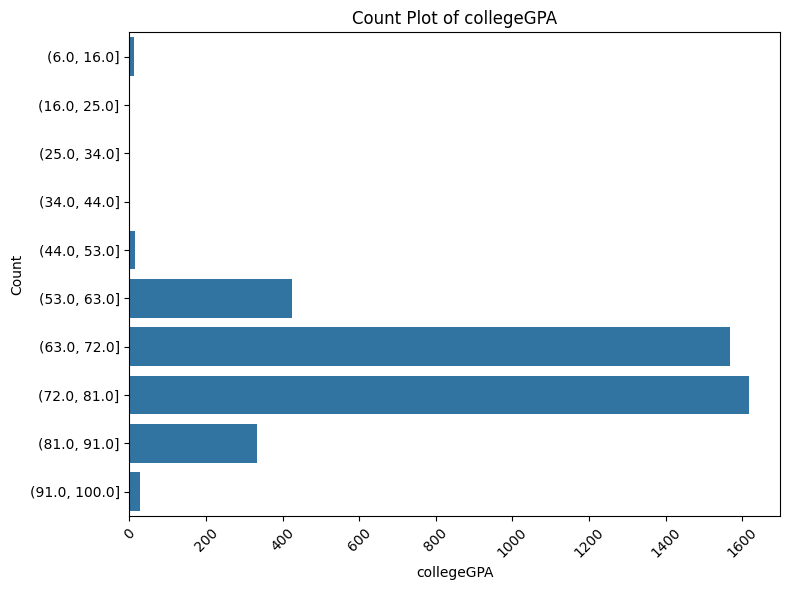

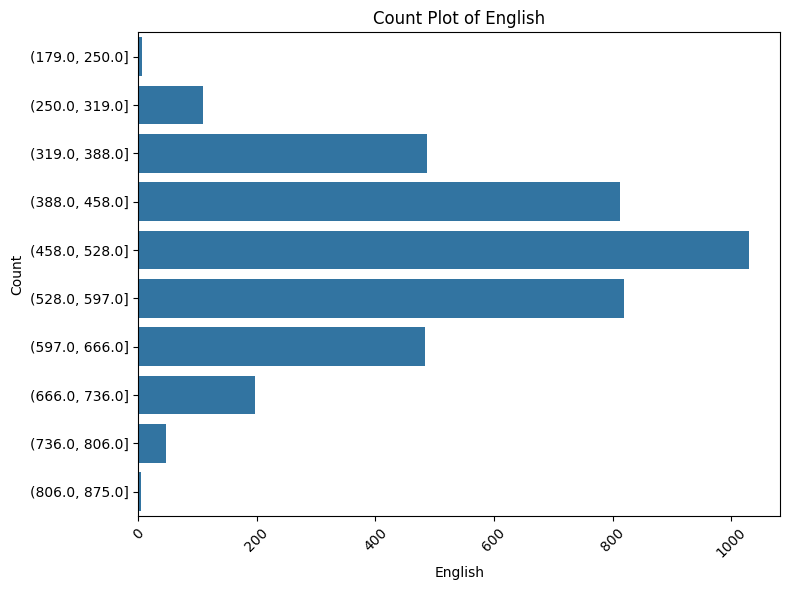

...

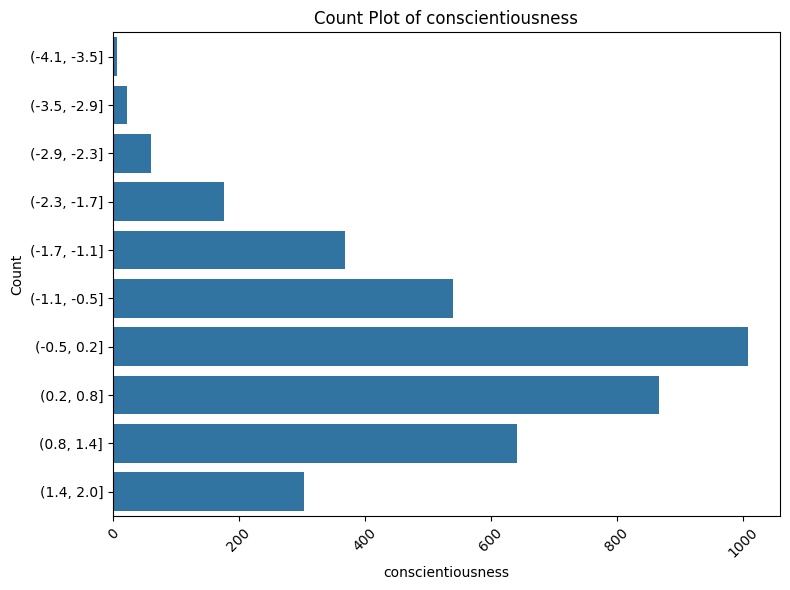

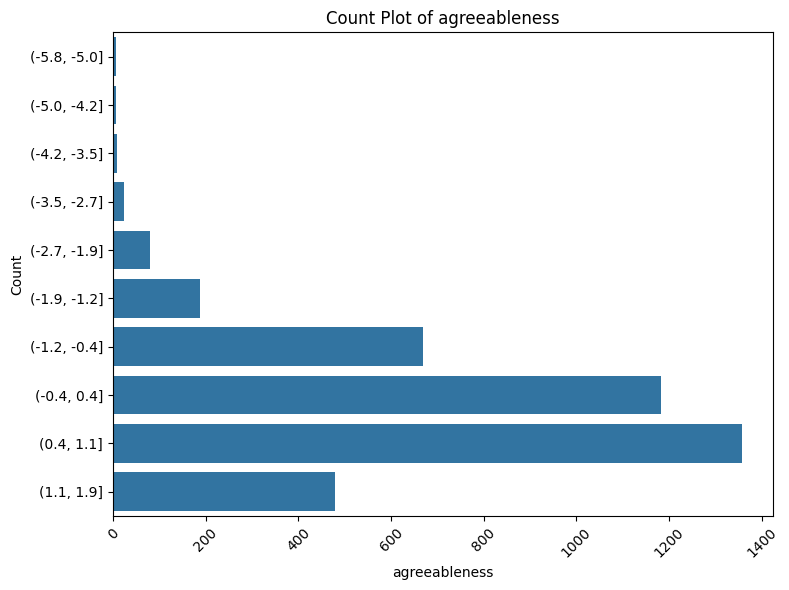

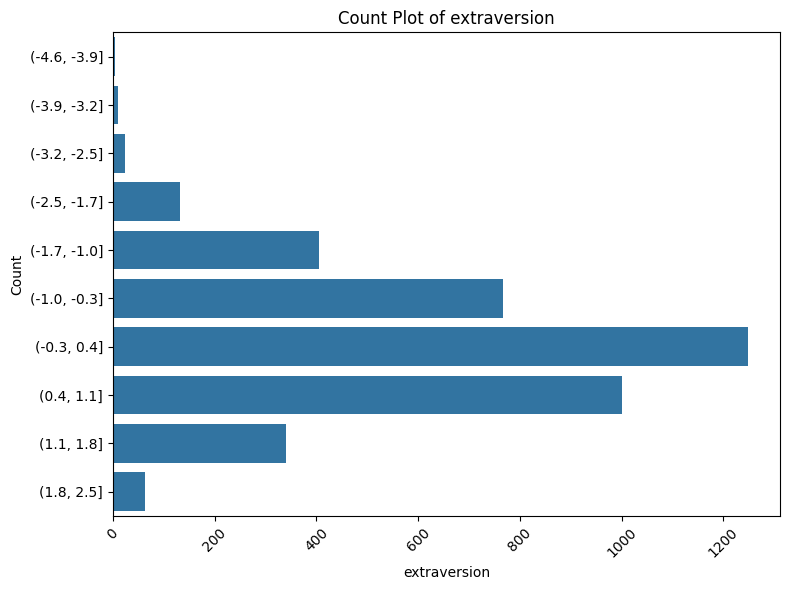

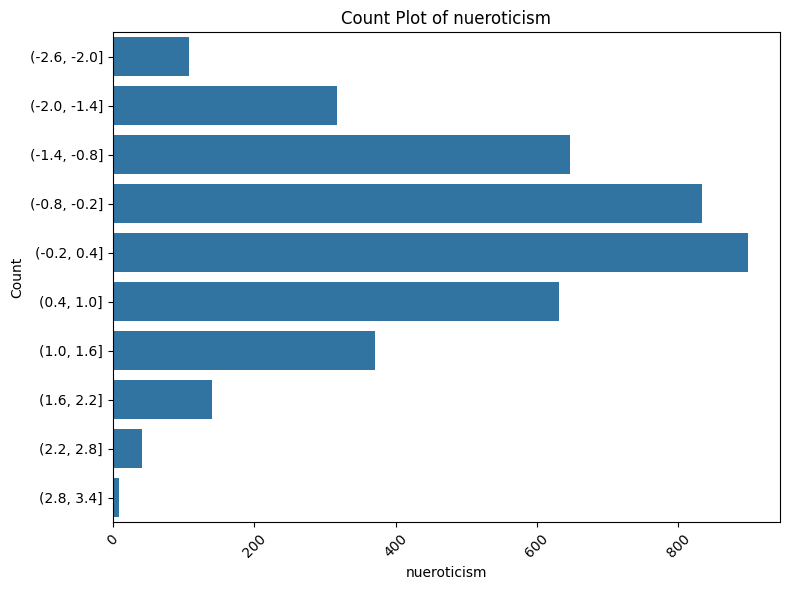

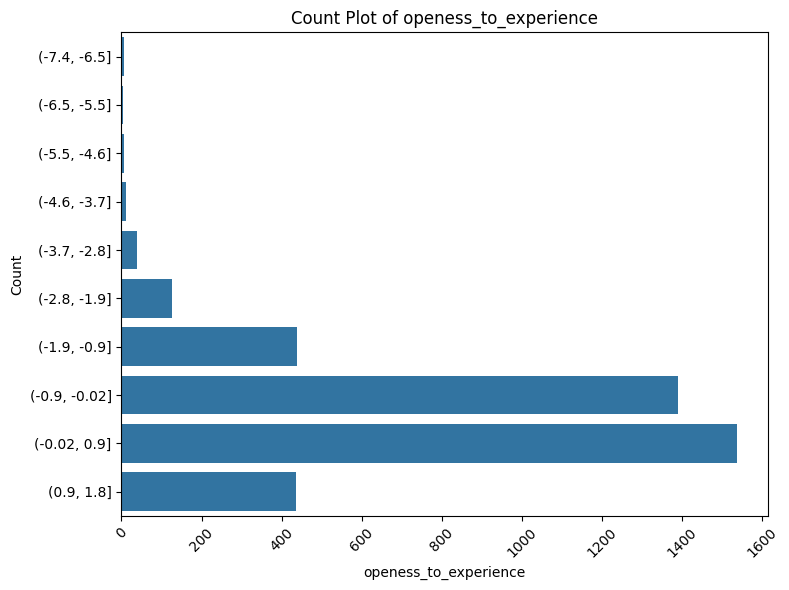

In [ ]:
#its for count plots
# Assuming 'df' is your DataFrame and 'numerical_columns' is a list of numerical columns of interest
numerical_columns = ['Salary','10percentage','12percentage','collegeGPA', 'English', 'Logical', 'Quant',
       'Domain', 'ComputerProgramming', 'ElectronicsAndSemicon',
       'ComputerScience', 'MechanicalEngg', 'ElectricalEngg', 'TelecomEngg',
       'CivilEngg', 'conscientiousness', 'agreeableness', 'extraversion',
       'nueroticism', 'openess_to_experience']  # Add your numerical columns of interest here

num_bins = 10
for column in numerical_columns:
    plt.figure(figsize=(8, 6))
    bins = pd.cut(df[column], num_bins, precision=0)  # Bin the data
    sns.countplot(bins)
    plt.title(f'Count Plot of {column}')
    plt.xlabel(column)
    plt.ylabel('Count')
    plt.xticks(rotation=45)
    plt.tight_layout()
    plt.show()


The Count plot :

1. Salary : In the graph we can see that around 31035-431500 candidates have salary around 35 lakh and around 431500-82800 are having salary on average around 5lakh. We also have some candidates who have salary range below 10 thousand per annum. The range of those candidates is 82800-1224500.

2. 10Percentage : As per the variation of this graph we can see that in the graph many students had scored marks in range 81-87% which is highest range. While the lowest range where students had scored low marks is 43-48.

3. 12Percentage : The lowest count of this plot is 10% of students who had scored marks in the range of 40-46% and the highest is in the range 69-75% and around 750% of students had scored around that much.

4. collegeGPA : For this graph we have two lowest gpa one lies between 6-16 and another lies between 44-53. Both having the same % of students who have scored the gpa. We have the highest range of 72-81% which is almost more that 1600 students from 4000 students.


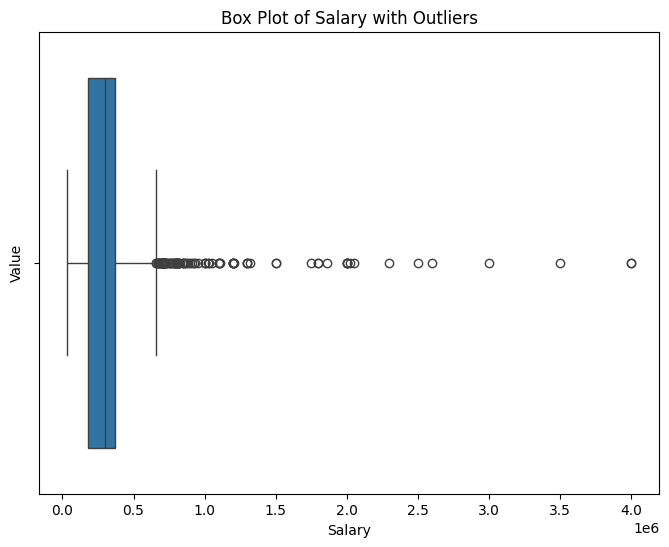

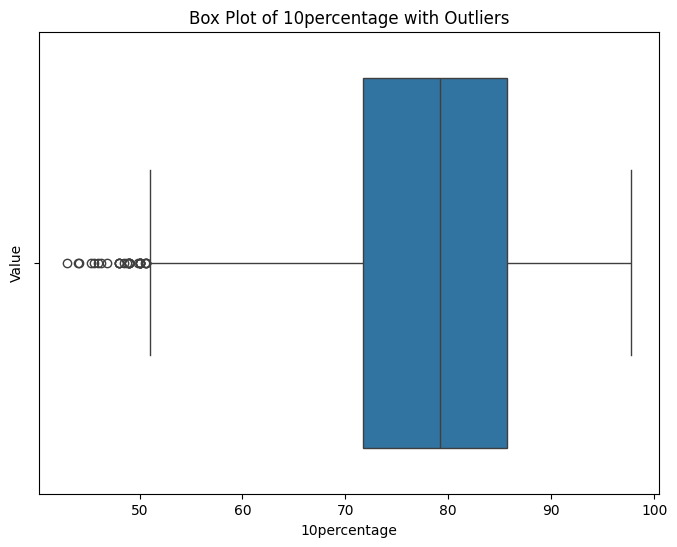

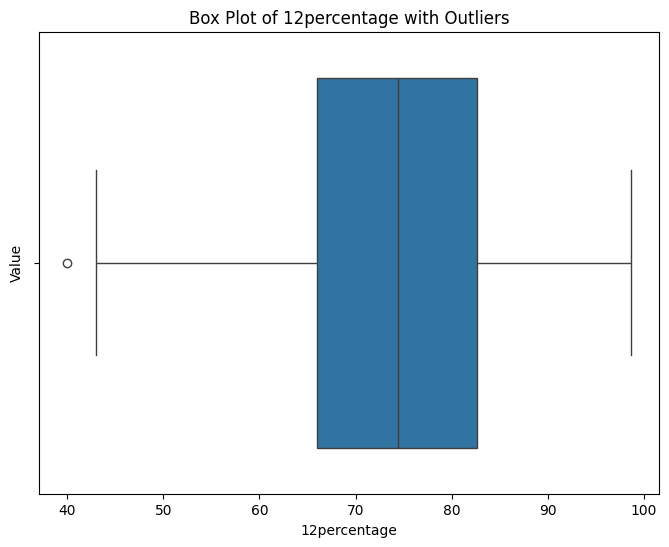

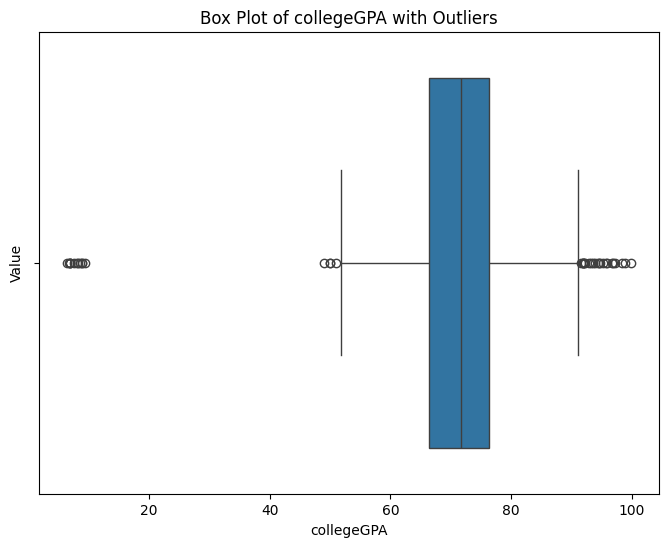

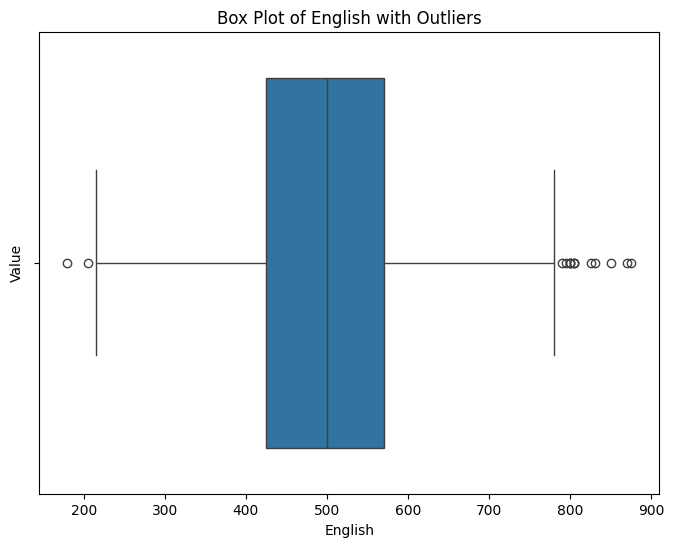

...

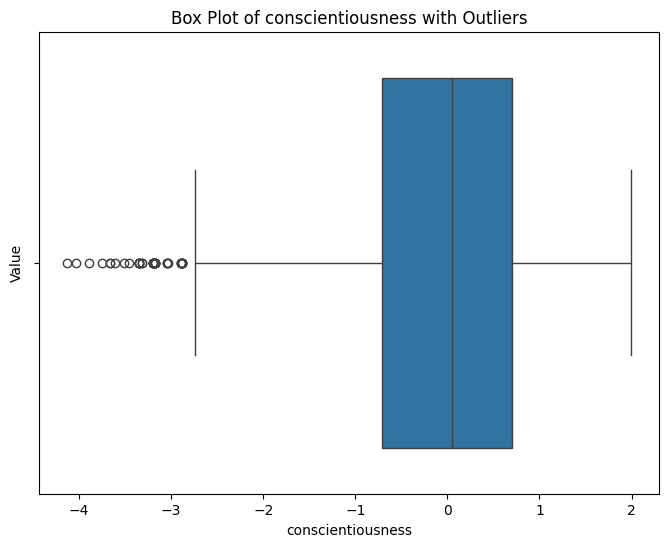

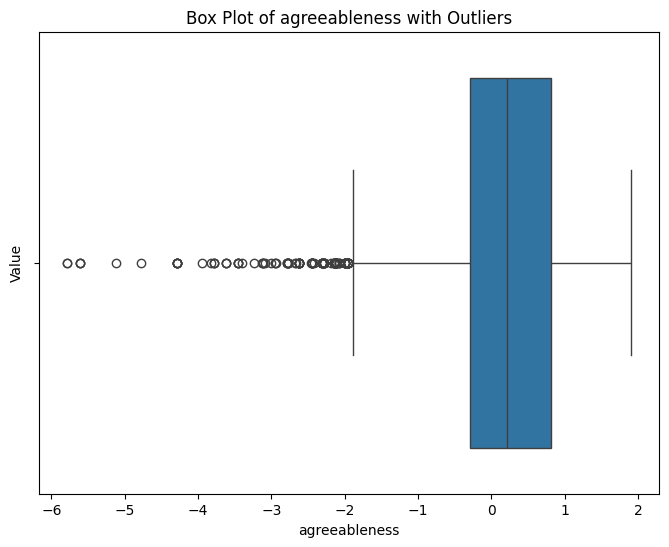

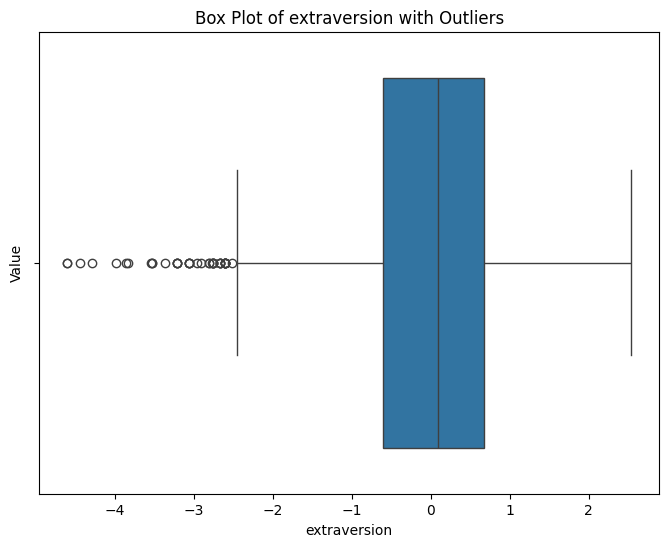

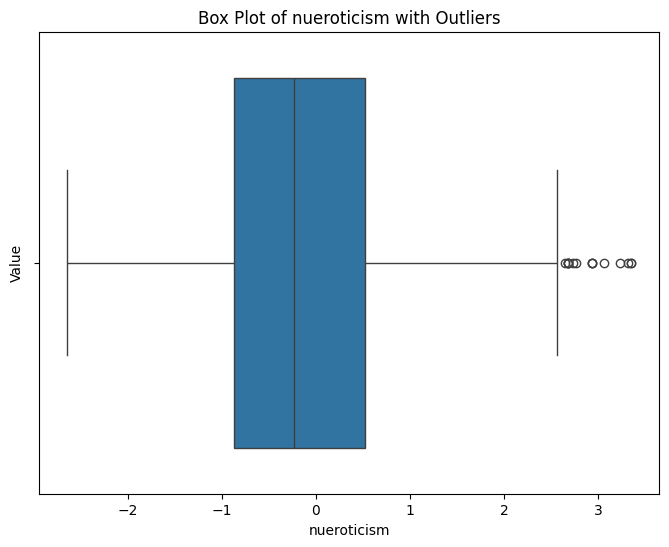

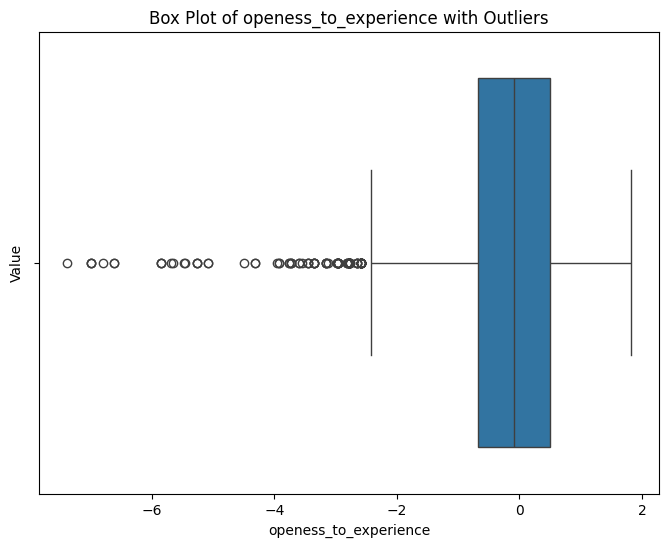

In [ ]:
#outliers by using showfliers
numerical_columns = ['Salary','10percentage','12percentage','collegeGPA', 'English', 'Logical', 'Quant',
       'Domain', 'ComputerProgramming', 'ElectronicsAndSemicon',
       'ComputerScience', 'MechanicalEngg', 'ElectricalEngg', 'TelecomEngg',
       'CivilEngg', 'conscientiousness', 'agreeableness', 'extraversion',
       'nueroticism', 'openess_to_experience']

for column in numerical_columns:
    plt.figure(figsize=(8, 6))
    sns.boxplot(x=df[column], showfliers=True)  # Set showfliers=True to display outliers
    plt.title(f'Box Plot of {column} with Outliers')
    plt.xlabel(column)
    plt.ylabel('Value')
    plt.show()

Above are Box plots with outliers. Some box plot contains min quartiles range and some contains outliers at max quartiles.
1. If we see the salary plot we can see that the it doesn't contain any min
quartiles but it contains max quartiles even the IQR interquartile range is between 2 to 4.
2. The 10percentage, 12percentage and collegeGPA quartiles are in a stat as we can see their outliers are at min range and also the plot range of 10Percentage is between 75-85, 12percentage is between 65-83, and collegeGPA is between 65-75.
3. The plots of english, logical, quant, domain has shown a great variance. english, logical, quant had IQR around around 420-580. All these three graphs also contains outliers at min and max ranges. We can see that domain contains outliers at min range of -1. While its IQR is between 3 to 8. The plot of computer programming shows perfectly that it contains 2 outliers and the range of IQR is betweeb 300 to 500. The electronics and semicon is having only 1 outlier at max range and its IQR q1 is 0 to q3 220.
4. Hence, the plots computer science, mechanicalengg, electricalengg, telecom, civilengg are showing the bad stats. Where they contains a lot no. of quartiles but the IQR range is much narrower and is itself in 0 base.
5. The personality trait columns are showing a great range around 0. conscientiousness, agreeableness, extraversion, openess to experience are showing outliers at min range while nueroticism is showing max range.


In [ ]:
numerical_columns = ['Salary','10percentage','12percentage','collegeGPA', 'English', 'Logical', 'Quant',
       'Domain', 'ComputerProgramming', 'ElectronicsAndSemicon',
       'ComputerScience', 'MechanicalEngg', 'ElectricalEngg', 'TelecomEngg',
       'CivilEngg', 'conscientiousness', 'agreeableness', 'extraversion',
       'nueroticism', 'openess_to_experience']

# Define a function to remove outliers based on IQR
def remove_outliers_iqr(data):
    Q1 = data.quantile(0.25)
    Q3 = data.quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    return data[(data >= lower_bound) & (data <= upper_bound)]

# Remove outliers from each numerical column of interest
for column in numerical_columns:
    df[column] = remove_outliers_iqr(df[column])

# Now 'df' contains the data with outliers removed


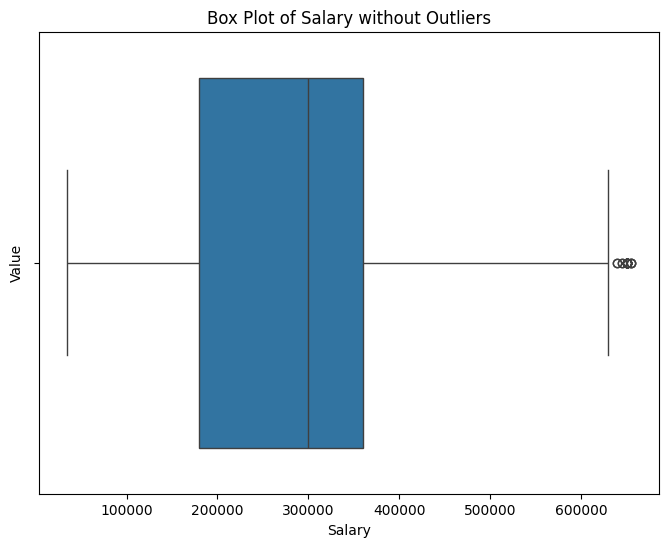

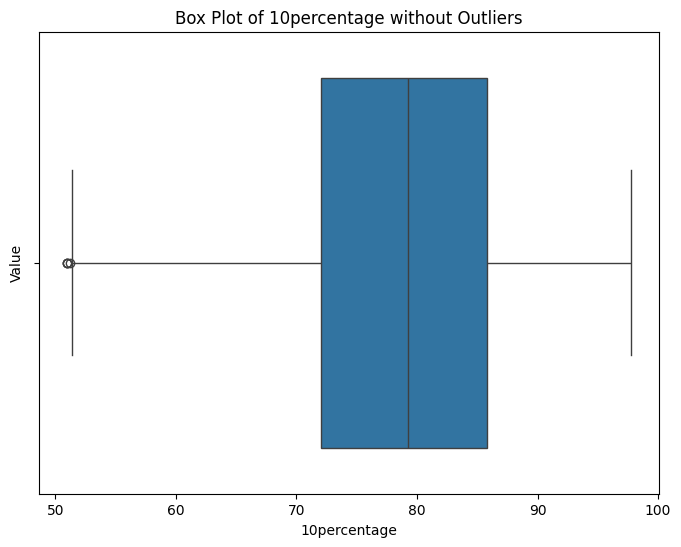

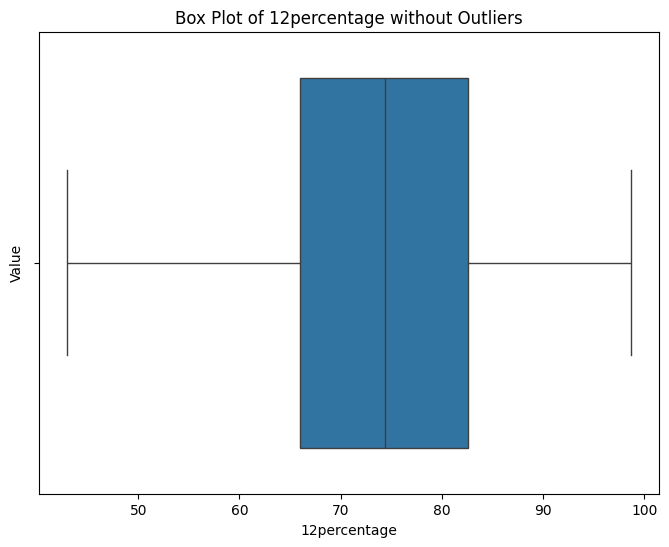

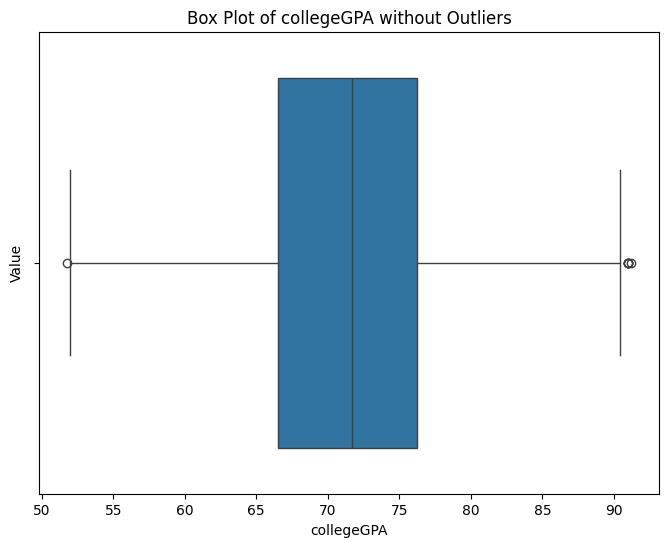

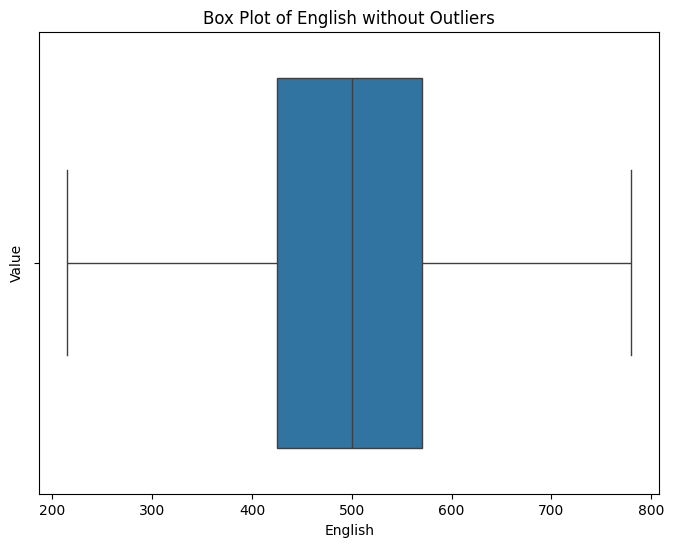

...

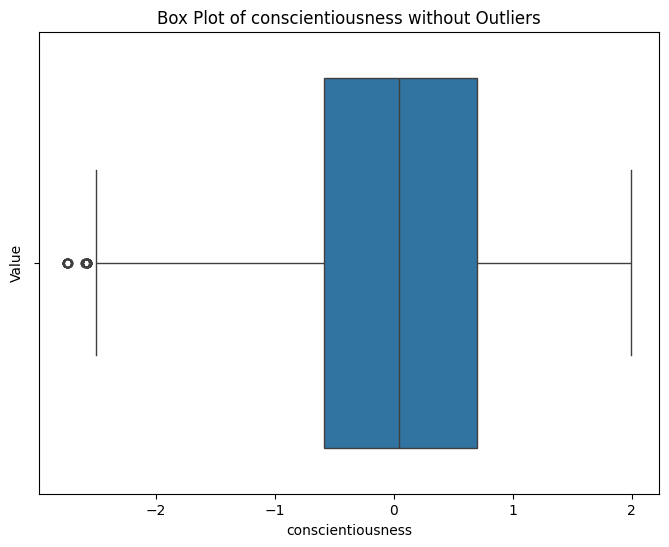

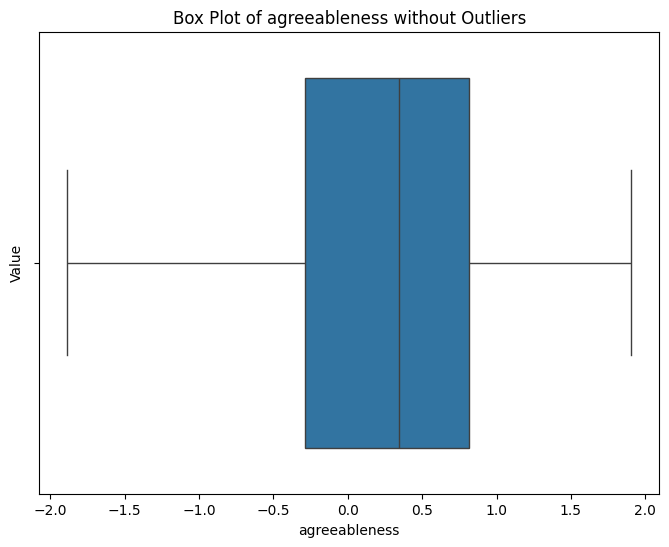

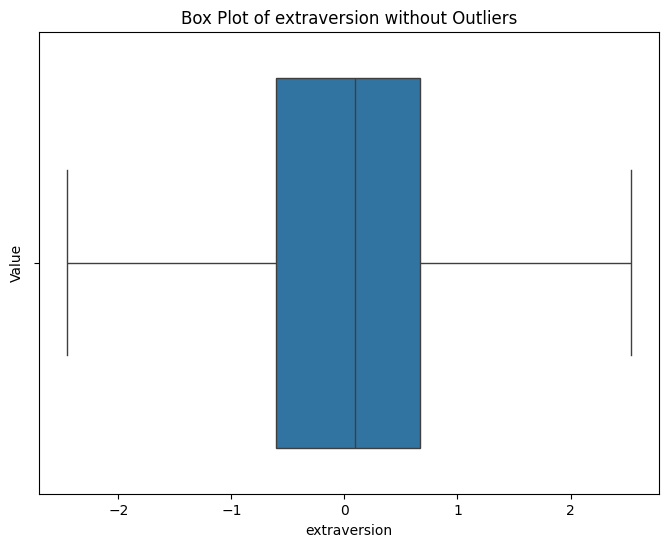

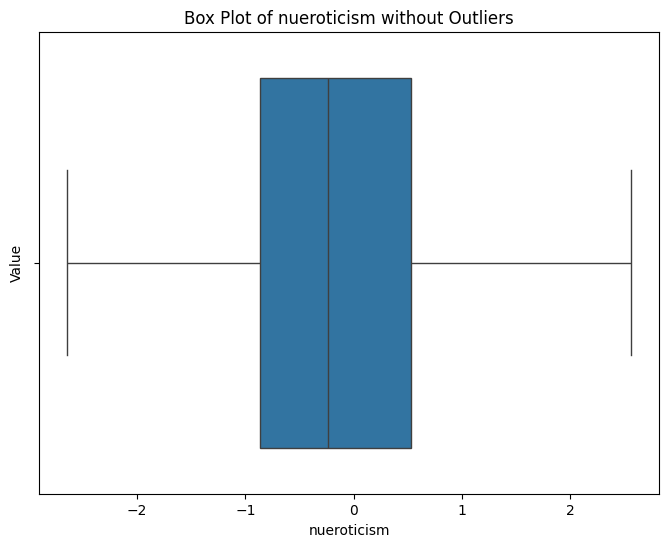

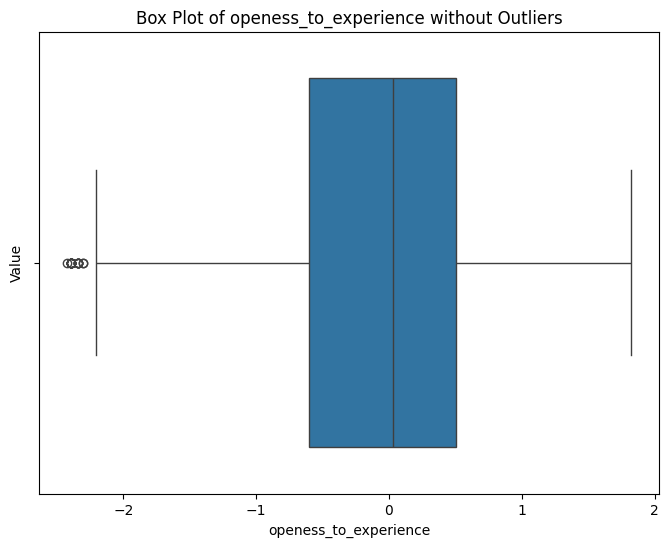

In [ ]:
numerical_columns = ['Salary','10percentage','12percentage','collegeGPA', 'English', 'Logical', 'Quant',
       'Domain', 'ComputerProgramming', 'ElectronicsAndSemicon',
       'ComputerScience', 'MechanicalEngg', 'ElectricalEngg', 'TelecomEngg',
       'CivilEngg', 'conscientiousness', 'agreeableness', 'extraversion',
       'nueroticism', 'openess_to_experience']

for column in numerical_columns:
    plt.figure(figsize=(8, 6))
    sns.boxplot(x=df[column])  # Set showfliers=True to display outliers
    plt.title(f'Box Plot of {column} without Outliers')
    plt.xlabel(column)
    plt.ylabel('Value')
    plt.show()

Above we have box plots after removing outliers Due to which the visuality of the IQR range has shown a great appearance. Even though after removing outliers the computer science, mechanicalengg, electricalengg,telecomengg, civilengg is not showing wider IQR range. Though we can see the wider IQR range of other plots.

In [ ]:
#Count plot for categorical columns

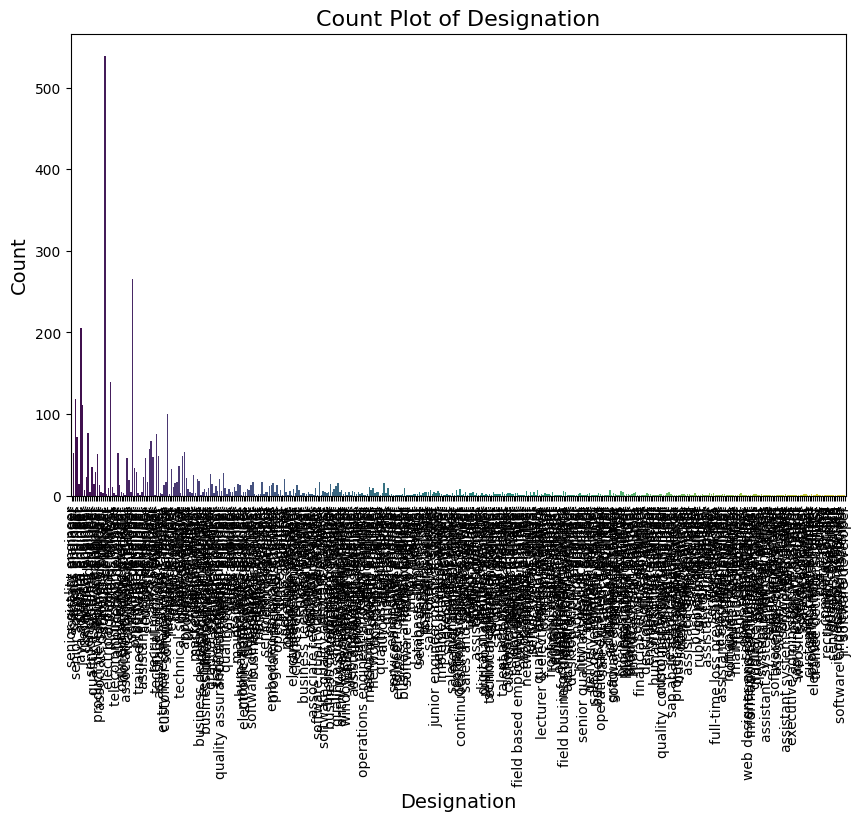

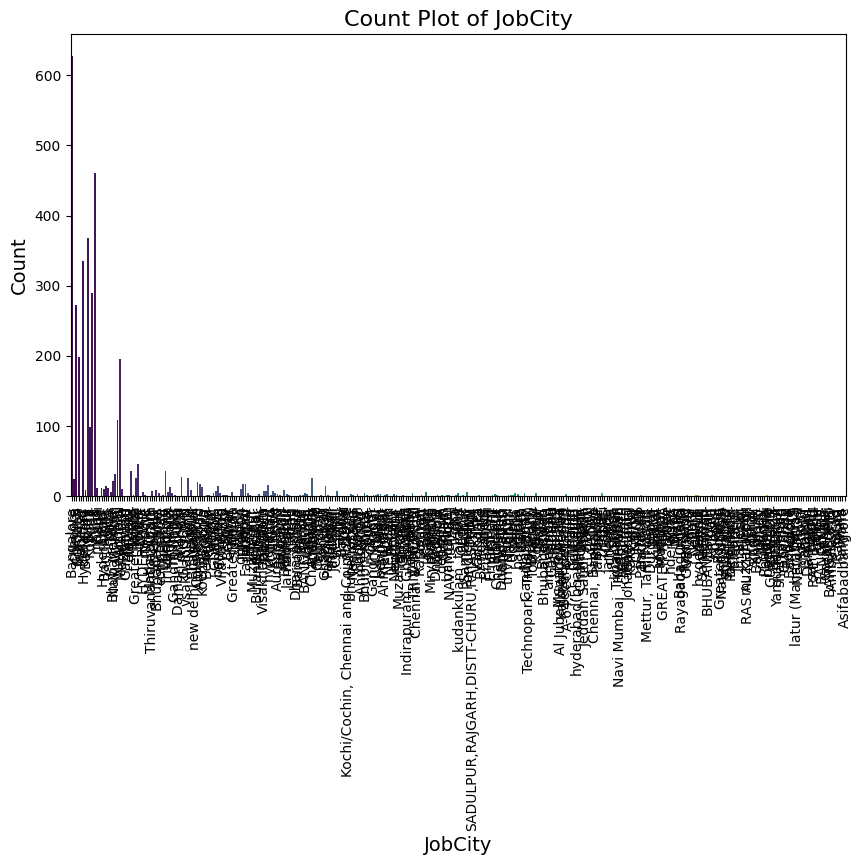

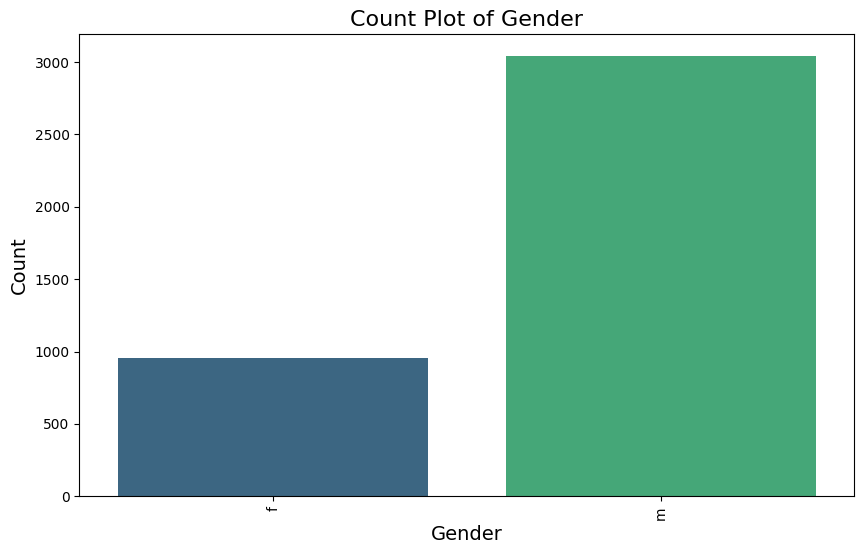

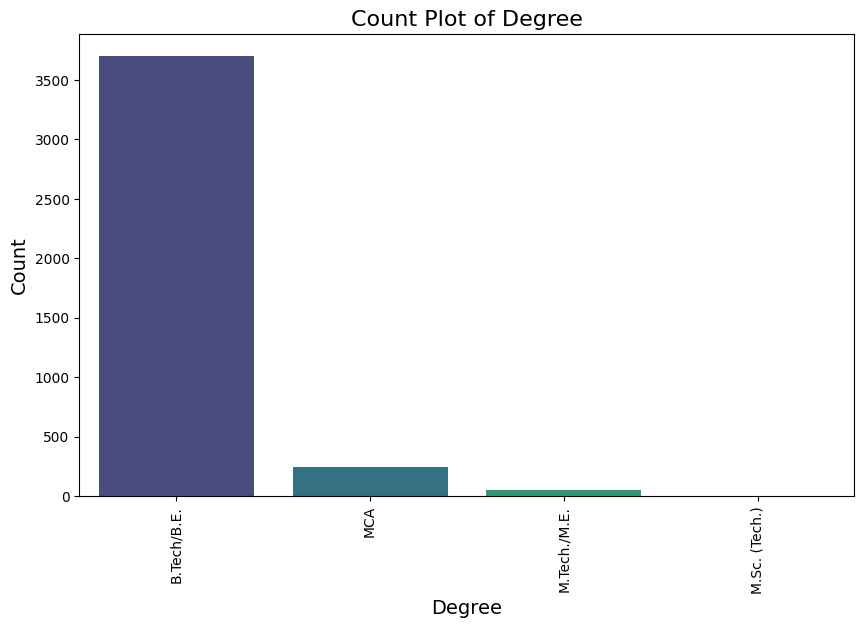

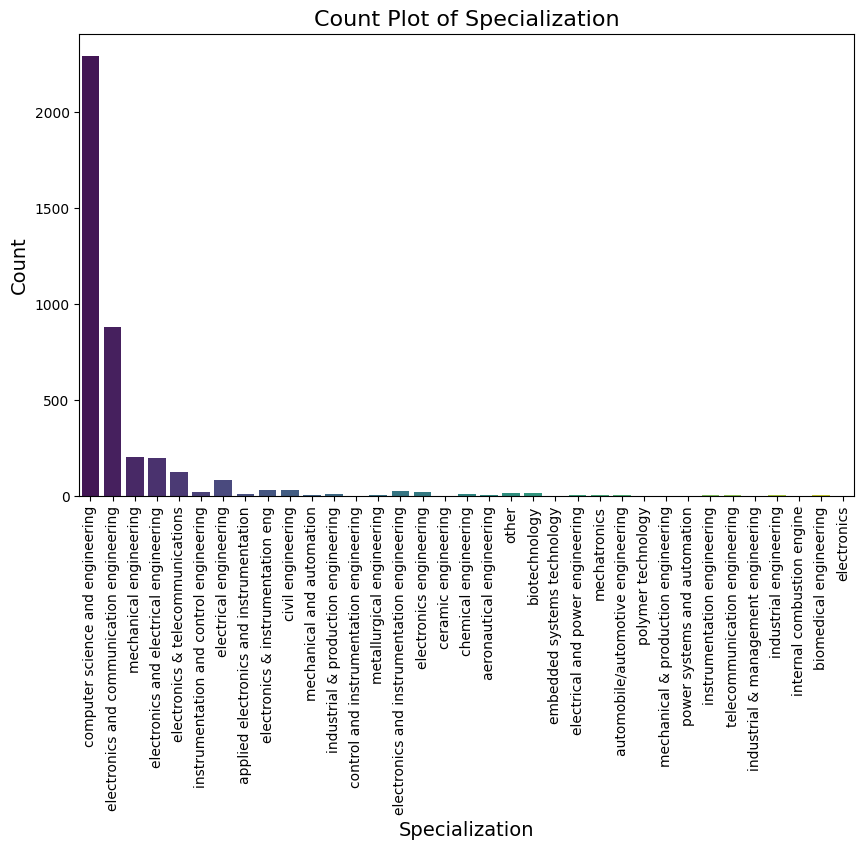

In [ ]:
#Count plot for categorical columns
warnings.filterwarnings('ignore')
categorical_columns = ['Designation', 'JobCity','Gender', 'Degree','Specialization']

for column in categorical_columns:
    plt.figure(figsize=(10, 6))
    sns.countplot(x=column, data=df, palette='viridis')
    plt.title(f'Count Plot of {column}', fontsize=16)
    plt.xlabel(column, fontsize=14)
    plt.ylabel('Count', fontsize=14)
    plt.xticks(rotation=90)
    plt.show()

Plotted count plot of categorical columns.
Due to large no. of candidates and their profession we weren't able to visualize the count plot of designation same as for job city too. We can see the stats of Gender, degree and specialization.

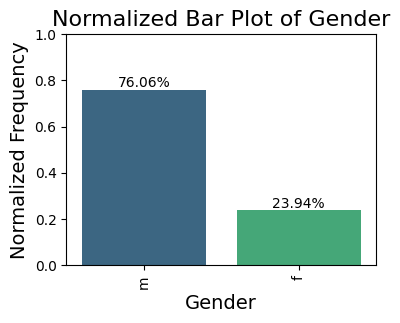

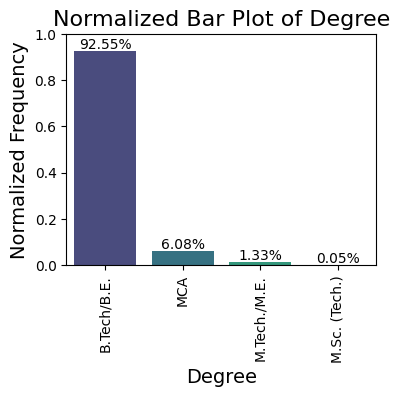

In [ ]:
warnings.filterwarnings('ignore')

#Bar plot for categorical columns
categorical_columns = ['Gender', 'Degree']
# Plot bar plots with normalized frequencies for each categorical column
for column in categorical_columns:
    plt.figure(figsize=(4, 3))  # Adjust the figure size as needed
    total_count = df[column].dropna().count()  # Total count of non-null values in the column
    sns.barplot(x=df[column].value_counts(normalize=True).index,
                y=df[column].value_counts(normalize=True).values,
                palette='viridis')  # Adjust palette as needed

    # Add percentage labels
    for i, v in enumerate(df[column].value_counts(normalize=True).values):
        plt.text(i, v + 0.01, f'{v*100:.2f}%', ha='center', fontsize=10)

    plt.title(f'Normalized Bar Plot of {column}', fontsize=16)  # Add title
    plt.xlabel(column, fontsize=14)  # Add x-axis label
    plt.ylabel('Normalized Frequency', fontsize=14)  # Add y-axis label
    plt.xticks(rotation=90)  # Rotate x-axis labels if needed
    plt.ylim(0, 1)  # Set y-axis limit to ensure percentages are within the plot range
    plt.show()


The above normalizaed plot is showing grequency of candidate who are female and male also the degree stat. We have 76% of male stat while there is 23% of female stat. In degree 92% are from btech/BE field. And the remaining 8% is from MCA background, M.tech/ME or M.sc(tech.) backgrounds.

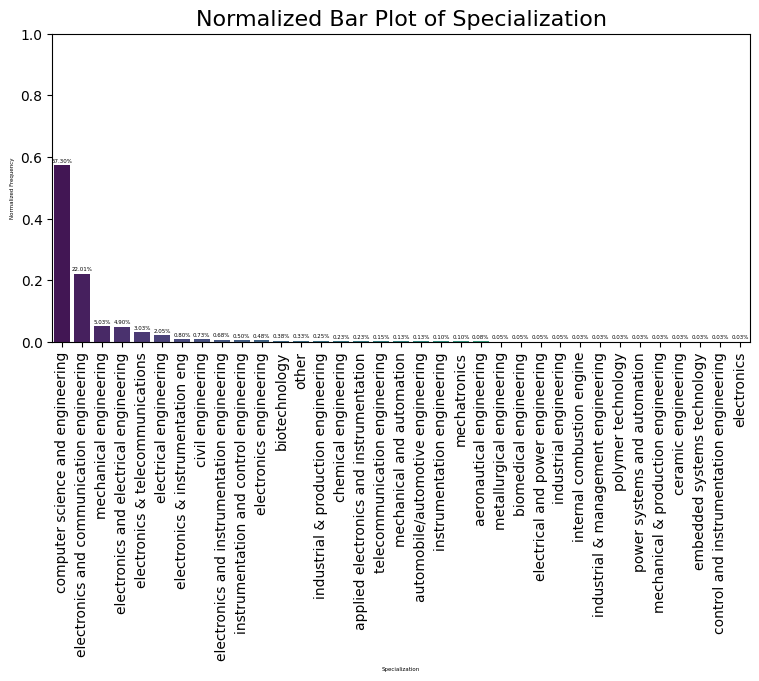

In [ ]:
#Bar plot for categorical columns
categorical_columns = ['Specialization']
# Plot bar plots with normalized frequencies for each categorical column
for column in categorical_columns:
    plt.figure(figsize=(9, 4))  # Adjust the figure size as needed
    total_count = df[column].dropna().count()  # Total count of non-null values in the column
    sns.barplot(x=df[column].value_counts(normalize=True).index,
                y=df[column].value_counts(normalize=True).values, palette='viridis')  # Adjust palette as needed

    # Add percentage labels
    for i, v in enumerate(df[column].value_counts(normalize=True).values):
        plt.text(i, v + 0.01, f'{v*100:.2f}%', ha='center', fontsize=4)

    plt.title(f'Normalized Bar Plot of {column}', fontsize=16)  # Add title
    plt.xlabel(column, fontsize=4)  # Add x-axis label
    plt.ylabel('Normalized Frequency', fontsize=4)  # Add y-axis label
    plt.xticks(rotation=90)  # Rotate x-axis labels if needed
    plt.ylim(0, 1)  # Set y-axis limit to ensure percentages are within the plot range
    plt.show()


The above plot is showing the stats bar of specializations. We can see that the Computer science and engineering is having the highest range of frequency. And from field biotechnology till telcommunication engineering having count as 25% then mechanical and automation and automobile/automotive engineering is having 15% count. The graph is decreasing from there. we have second highest range of electronics and communication engineering which is 22%. After that 3rd is mechanical engineering.

In [ ]:
#bivariate analysis
# a. continuous vs continuous numerical data

In [ ]:
df.columns

Index(['Unnamed: 0', 'ID', 'Salary', 'DOJ', 'DOL', 'Designation', 'JobCity',
       'Gender', 'DOB', '10percentage', '10board', '12graduation',
       '12percentage', '12board', 'CollegeID', 'CollegeTier', 'Degree',
       'Specialization', 'collegeGPA', 'CollegeCityID', 'CollegeCityTier',
       'CollegeState', 'GraduationYear', 'English', 'Logical', 'Quant',
       'Domain', 'ComputerProgramming', 'ElectronicsAndSemicon',
       'ComputerScience', 'MechanicalEngg', 'ElectricalEngg', 'TelecomEngg',
       'CivilEngg', 'conscientiousness', 'agreeableness', 'extraversion',
       'nueroticism', 'openess_to_experience'],
      dtype='object')

In [ ]:
df.corr()

<ipython-input-17-2f6f6606aa2c>:1: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  df.corr()


,ID,Salary,10percentage,12graduation,12percentage,CollegeID,CollegeTier,collegeGPA,CollegeCityID,CollegeCityTier,...,ComputerScience,MechanicalEngg,ElectricalEngg,TelecomEngg,CivilEngg,conscientiousness,agreeableness,extraversion,nueroticism,openess_to_experience
ID,1.000000,-0.247294,0.044547,0.673102,0.007069,0.284540,0.035160,0.047144,0.284540,-0.035977,...,0.482626,-0.026147,0.104454,-0.049272,-0.017871,0.175557,0.024837,0.120979,-0.146289,0.031359
Salary,-0.247294,1.000000,0.177373,-0.161383,0.170254,-0.118690,-0.179332,0.130103,-0.118690,0.015384,...,-0.100720,0.018475,-0.047598,-0.022691,0.037639,-0.064148,0.057423,-0.010213,-0.054685,-0.011312
10percentage,0.044547,0.177373,1.000000,0.269957,0.643378,0.021082,-0.126042,0.312538,0.021082,0.116707,...,-0.018933,0.050364,0.074419,0.049378,0.030002,0.067657,0.136645,-0.004679,-0.132496,0.036692
12graduation,0.673102,-0.161383,0.269957,1.000000,0.259166,0.254021,0.027691,0.086001,0.254021,-0.003016,...,0.293439,0.035459,0.123751,0.023470,-0.004727,0.103329,0.041182,0.061956,-0.074369,-0.015069
12percentage,0.007069,0.170254,0.643378,0.259166,1.000000,0.022336,-0.100771,0.346137,0.022336,0.130462,...,-0.043534,0.037635,0.064001,0.044201,0.005910,0.058299,0.103998,-0.007486,-0.094369,0.006332
CollegeID,0.284540,-0.118690,0.021082,0.254021,0.022336,1.000000,0.067054,0.017240,1.000000,0.007757,...,0.102303,-0.009291,0.022933,0.025620,0.005749,0.076432,-0.005264,0.005917,-0.008973,-0.010678
CollegeTier,0.035160,-0.179332,-0.126042,0.027691,-0.100771,0.067054,1.000000,-0.086781,0.067054,-0.101494,...,0.001053,-0.021548,0.002594,0.000007,-0.033722,0.055174,-0.038055,0.009970,0.023778,-0.019179
collegeGPA,0.047144,0.130103,0.312538,0.086001,0.346137,0.017240,-0.086781,1.000000,0.017240,0.017471,...,0.007601,-0.031765,0.052258,-0.005226,-0.018950,0.069582,0.068282,-0.032684,-0.074859,0.028071
CollegeCityID,0.284540,-0.118690,0.021082,0.254021,0.022336,1.000000,0.067054,0.017240,1.000000,0.007757,...,0.102303,-0.009291,0.022933,0.025620,0.005749,0.076432,-0.005264,0.005917,-0.008973,-0.010678
CollegeCityTier,-0.035977,0.015384,0.116707,-0.003016,0.130462,0.007757,-0.101494,0.017471,0.007757,1.000000,...,-0.010643,-0.052395,0.010311,0.049876,-0.033392,0.014763,0.005565,-0.008203,0.004442,-0.016790


from matplotlib import pyplot as plt
_df_0['ID'].plot(kind='hist', bins=20, title='ID')
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
_df_1['Salary'].plot(kind='hist', bins=20, title='Salary')
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
_df_2['10percentage'].plot(kind='hist', bins=20, title='10percentage')
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
_df_3['12graduation'].plot(kind='hist', bins=20, title='12graduation')
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
_df_4.plot(kind='scatter', x='ID', y='Salary', s=32, alpha=.8)
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
_df_5.plot(kind='scatter', x='Salary', y='10percentage', s=32, alpha=.8)
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
_df_6.plot(kind='scatter', x='10percentage', y='12graduation', s=32, alpha=.8)
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
_df_7.plot(kind='scatter', x='12graduation', y='12percentage', s=32, alpha=.8)
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
_df_8['ID'].plot(kind='line', figsize=(8, 4), title='ID')
plt.gca().spines[['top', 'right']].set_visible(False)

from matplotlib import pyplot as plt
_df_9['Salary'].plot(kind='line', figsize=(8, 4), title='Salary')
plt.gca().spines[['top', 'right']].set_visible(False)

from matplotlib import pyplot as plt
_df_10['10percentage'].plot(kind='line', figsize=(8, 4), title='10percentage')
plt.gca().spines[['top', 'right']].set_visible(False)

from matplotlib import pyplot as plt
_df_11['12graduation'].plot(kind='line', figsize=(8, 4), title='12graduation')
plt.gca().spines[['top', 'right']].set_visible(False)

In [ ]:
#Relationship between numerical columns using scatter plot

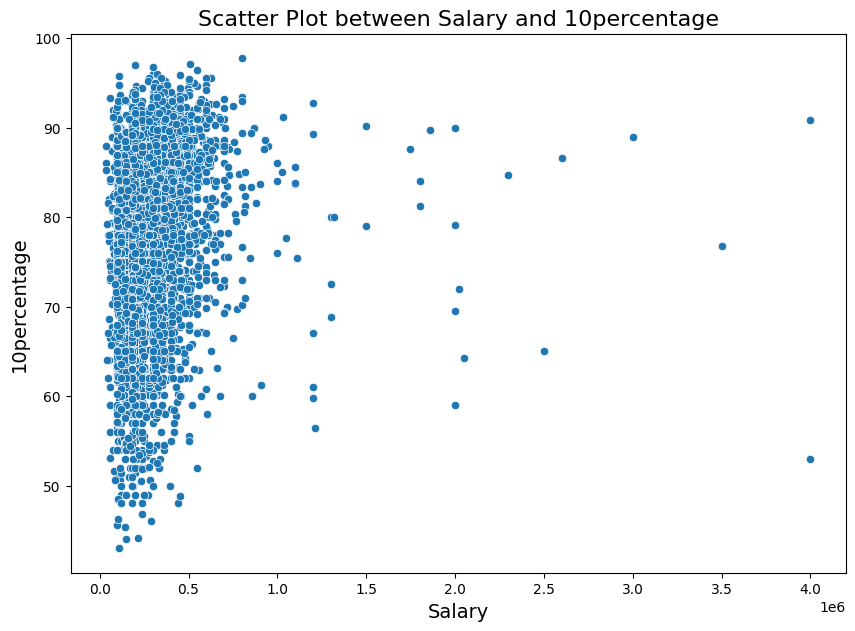

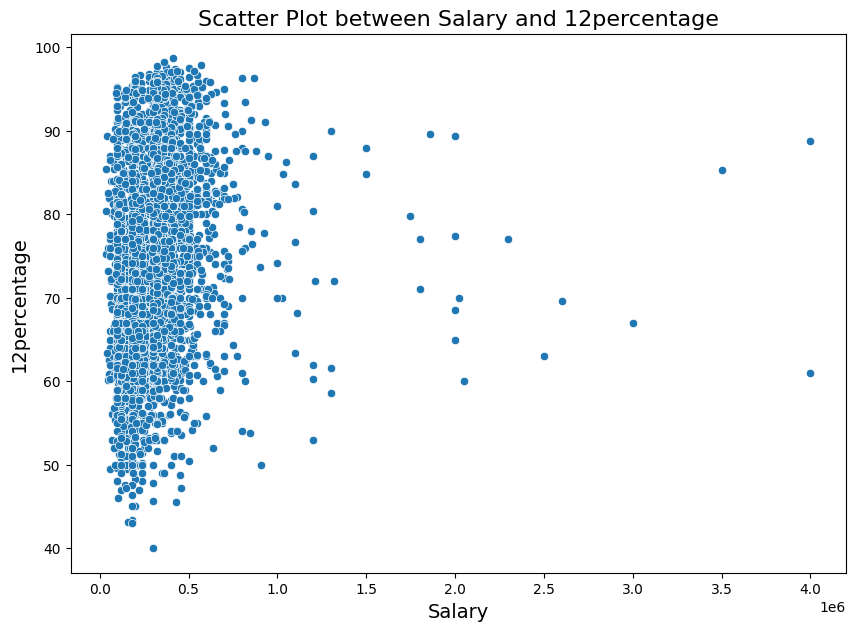

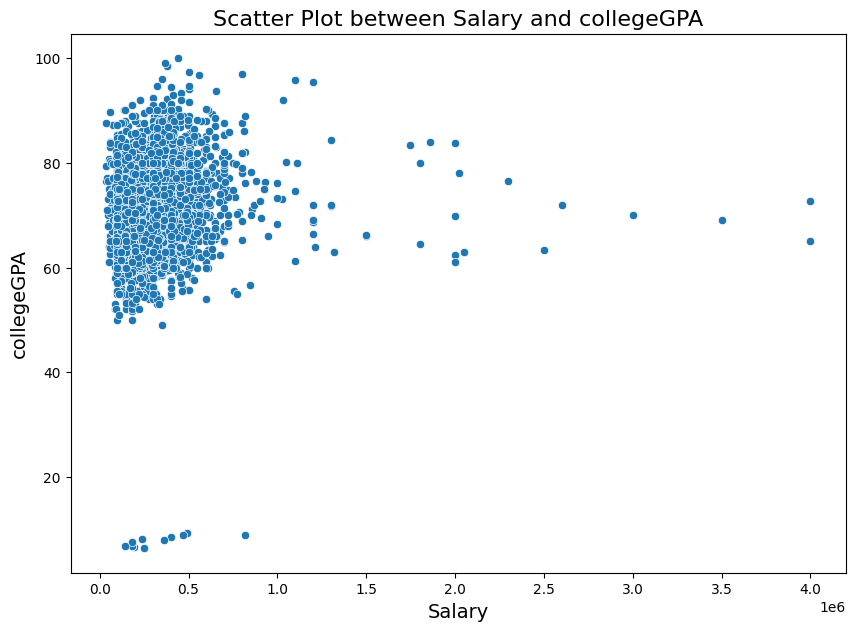

In [ ]:
#scatter Plot
numerical_column1 = ['Salary']
numerical_column2 = ['Salary','10percentage','12percentage','collegeGPA']
for col in numerical_column2[1:]:
    if col != 'Salary':  # Avoid plotting Salary against itself
        plt.figure(figsize=(10, 7))
        sns.scatterplot(x='Salary', y=col, data=df)
        plt.title(f'Scatter Plot between Salary and {col}', fontsize=16)  # Add title
        plt.xlabel('Salary', fontsize=14)  # Add x-axis label
        plt.ylabel(col, fontsize=14)  # Add y-axis label
        plt.show()

The above plot is a scatter plot between salary and 10percentage, 12percentage and collegegpa. Which is a numerical vs numerical column.

<Figure size 1000x700 with 0 Axes>

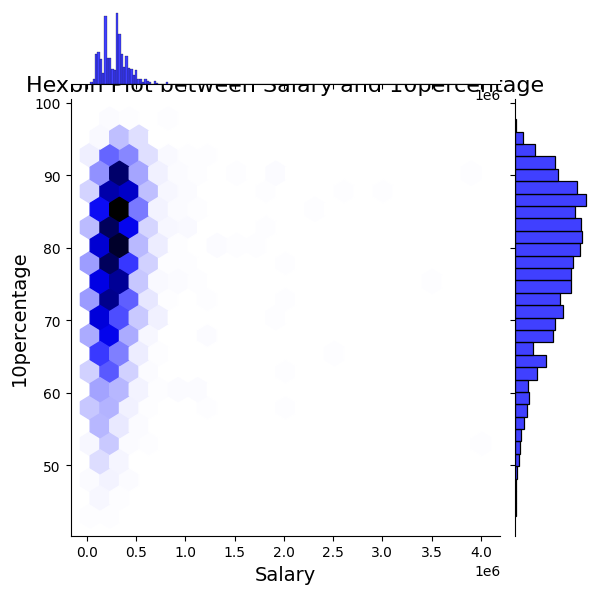

<Figure size 1000x700 with 0 Axes>

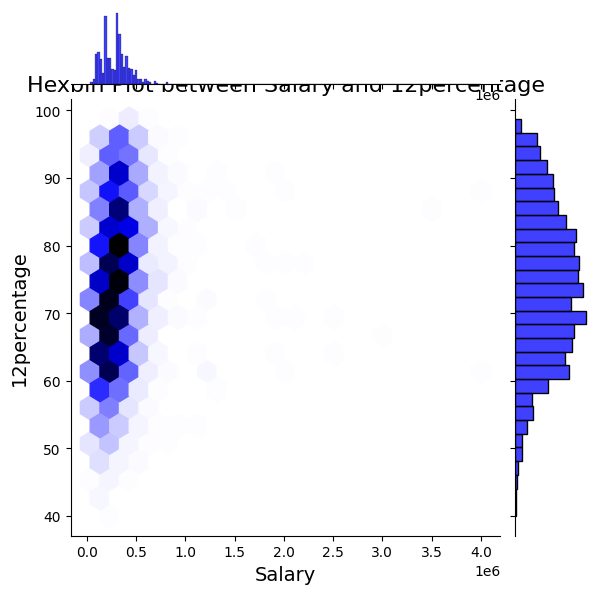

<Figure size 1000x700 with 0 Axes>

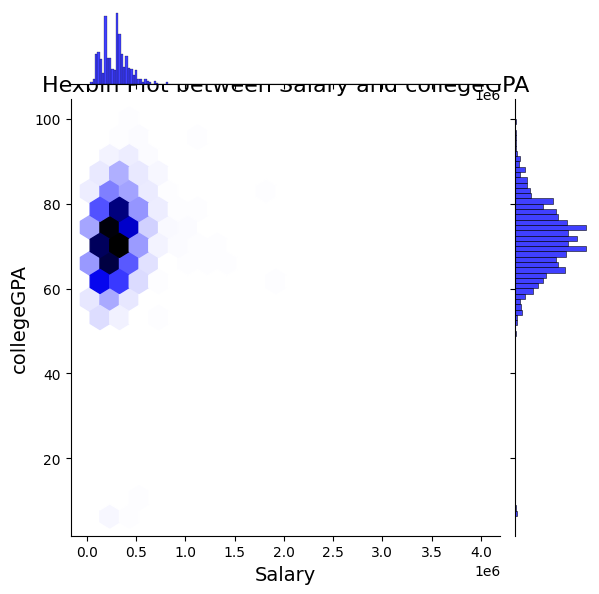

In [7]:
#hexbin plot
numerical_column1 = ['Salary']
numerical_column2 = ['Salary','10percentage','12percentage','collegeGPA']
for col in numerical_column2:
    if col != 'Salary':  # Avoid plotting Salary against itself
        plt.figure(figsize=(10, 7))
        sns.jointplot(x='Salary', y=col, kind='hex', data=df, color='blue', gridsize=20)
        plt.title(f'Hexbin Plot between Salary and {col}', fontsize=16)  # Add title
        plt.xlabel('Salary', fontsize=14)  # Add x-axis label
        plt.ylabel(col, fontsize=14)  # Add y-axis label
        plt.show()

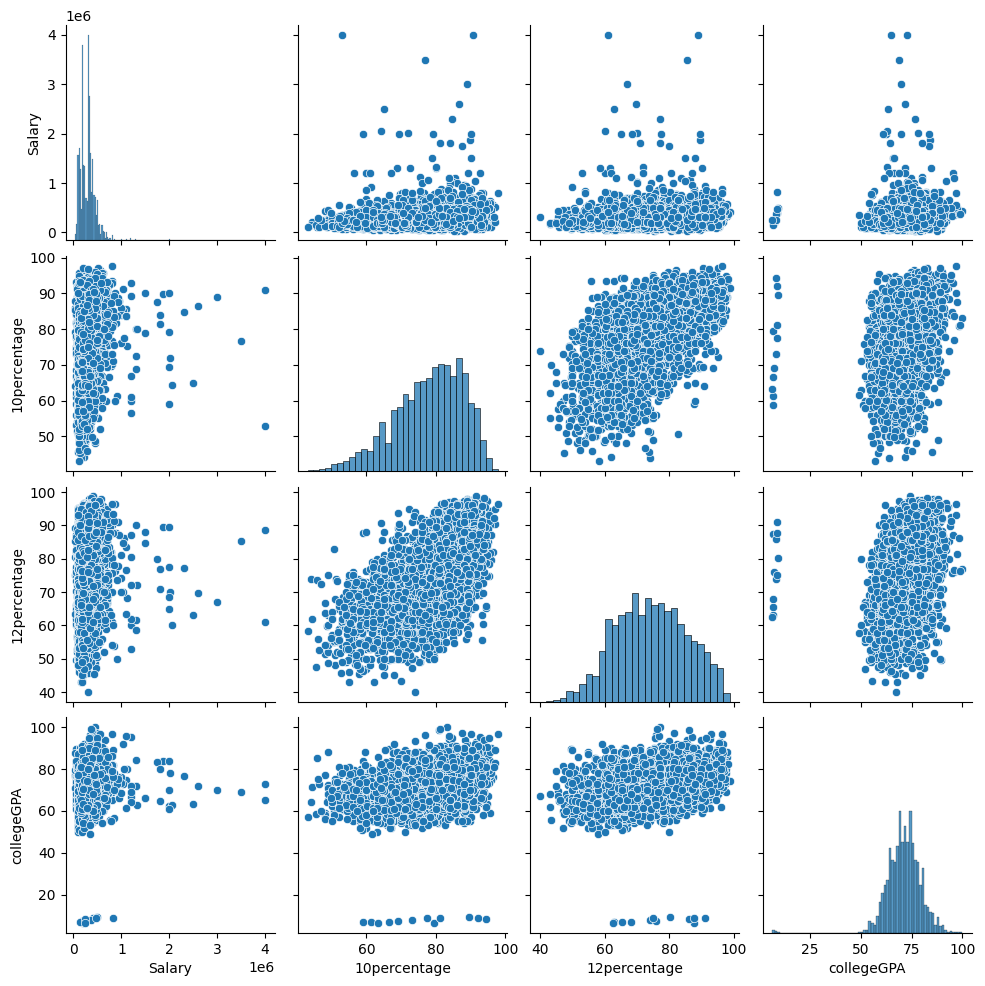

In [ ]:
#pair plots
numerical_columns = ['Salary','10percentage','12percentage','collegeGPA']

sns.pairplot(df[numerical_columns])
plt.show()

This is a pair plot between salary, 10 percentage, 12percentage, collegegpa.

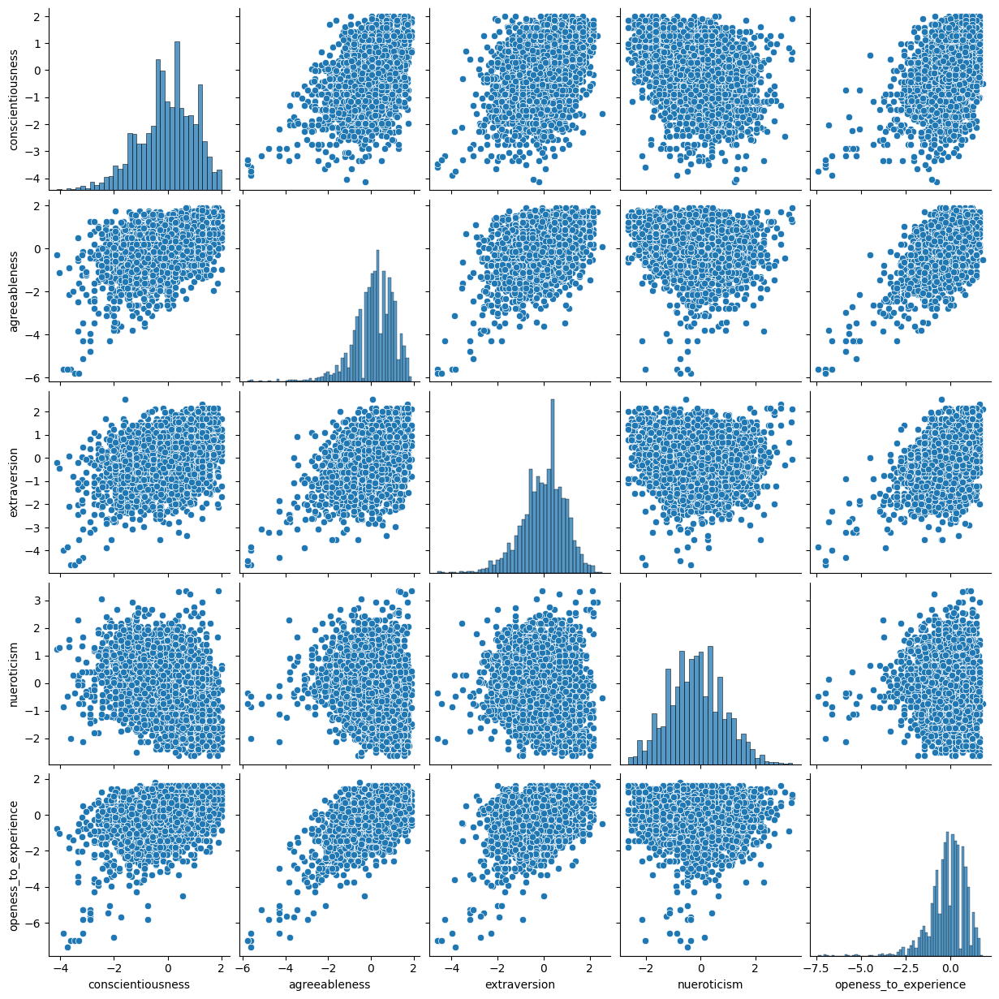

In [ ]:
numerical_columns = ['conscientiousness', 'agreeableness', 'extraversion',
       'nueroticism', 'openess_to_experience']

sns.pairplot(df[numerical_columns])
plt.show()

In [ ]:
#Numerical vs Categorical

In [ ]:
#Swarm Plots

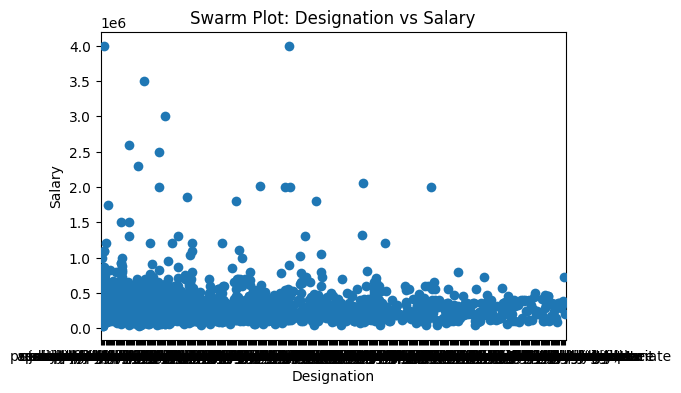

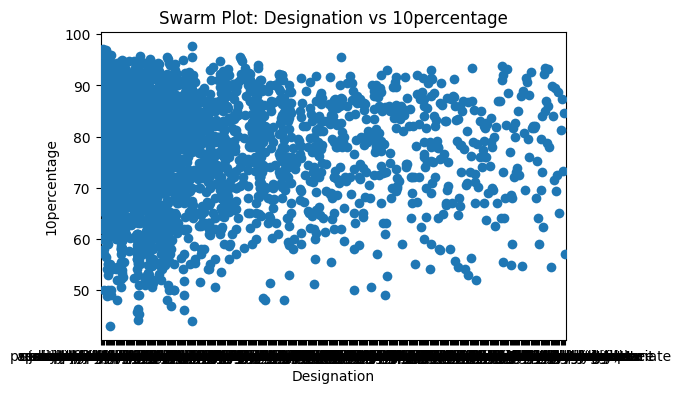

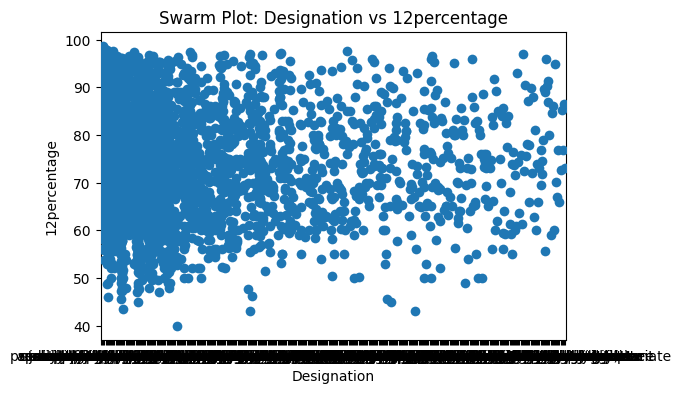

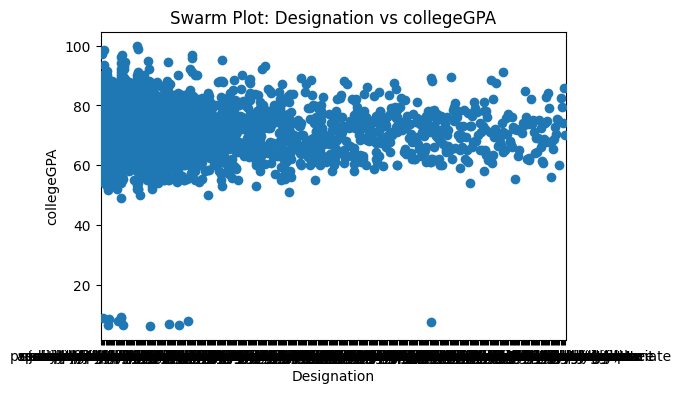

In [ ]:
#designation
import warnings
warnings.filterwarnings('ignore')

categorical_columns = ['Designation']
numerical_columns = ['Salary','10percentage','12percentage','collegeGPA']

for cat_col in categorical_columns:
    for num_col in numerical_columns:
        plt.figure(figsize=(6, 4))
        sns.swarmplot(x=cat_col, y=num_col, data=df, s=7)
        plt.title(f'Swarm Plot: {cat_col} vs {num_col}')
        plt.xlabel(cat_col)
        plt.ylabel(num_col)
        plt.show()


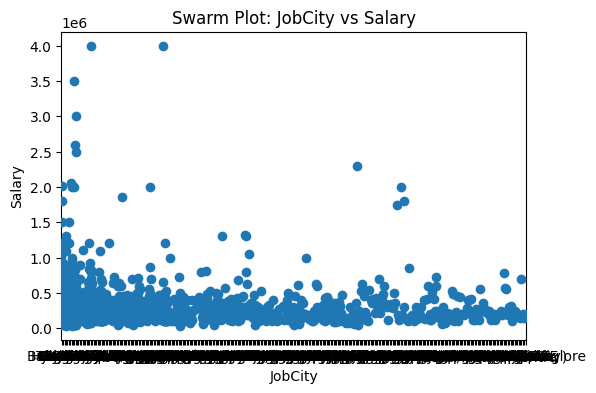

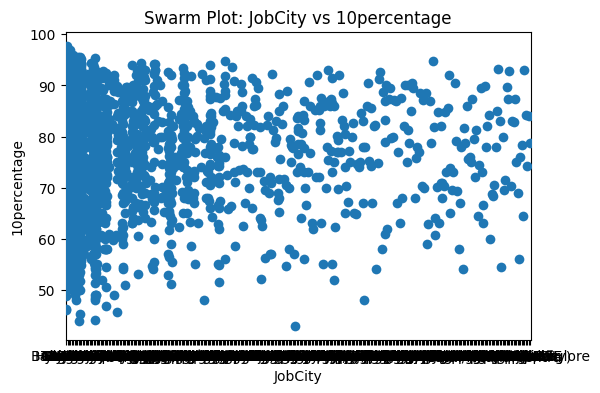

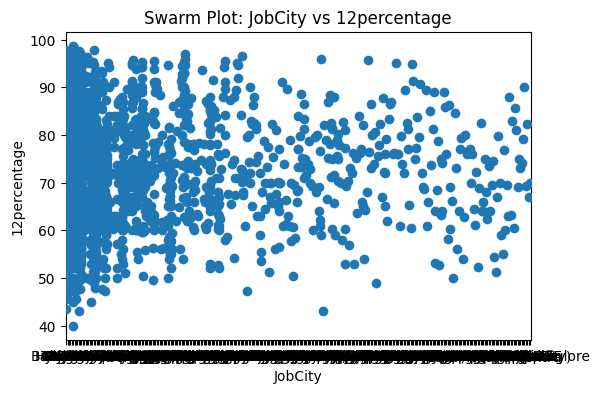

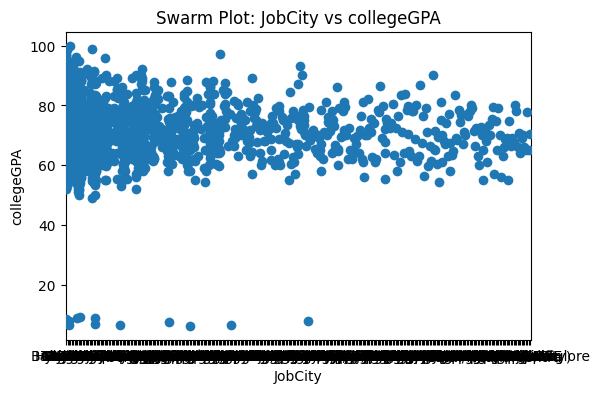

In [ ]:
#job city vs
import warnings
warnings.filterwarnings('ignore')

categorical_columns = ['JobCity']
numerical_columns = ['Salary','10percentage','12percentage','collegeGPA']

for cat_col in categorical_columns:
    for num_col in numerical_columns:
        plt.figure(figsize=(6, 4))
        sns.swarmplot(x=cat_col, y=num_col, data=df, s=7)
        plt.title(f'Swarm Plot: {cat_col} vs {num_col}')
        plt.xlabel(cat_col)
        plt.ylabel(num_col)
        plt.show()

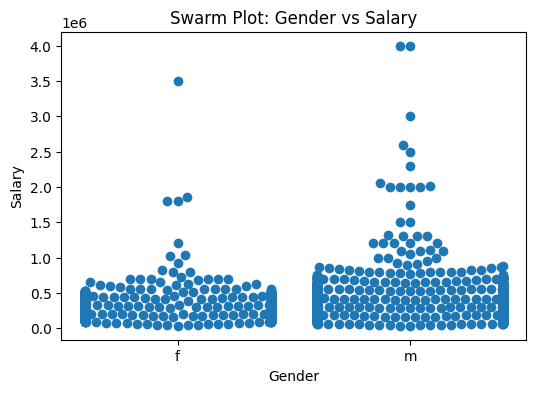

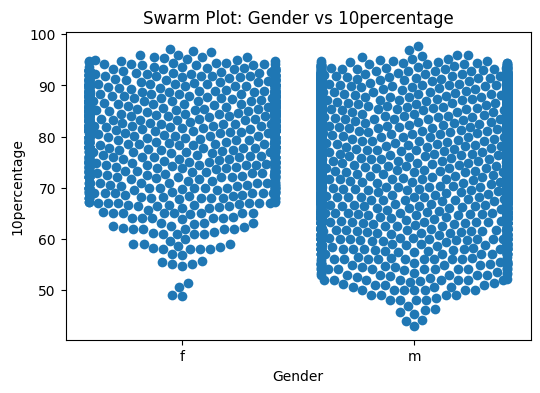

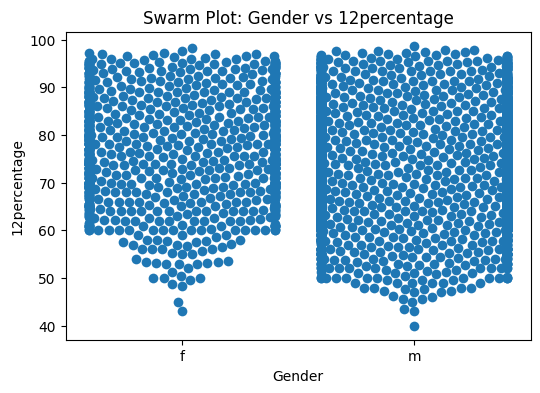

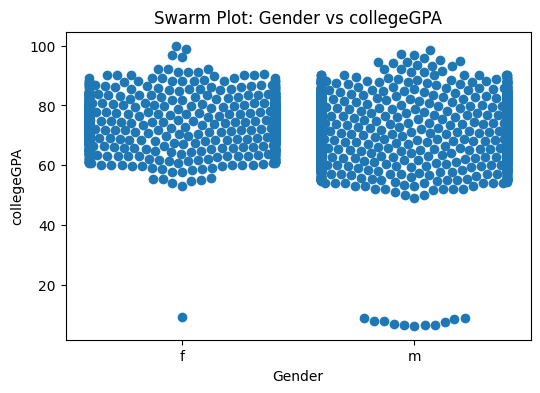

In [ ]:
#job city vs
import warnings
warnings.filterwarnings('ignore')

categorical_columns = ['Gender']
numerical_columns = ['Salary','10percentage','12percentage','collegeGPA']

for cat_col in categorical_columns:
    for num_col in numerical_columns:
        plt.figure(figsize=(6,4))
        sns.swarmplot(x=cat_col, y=num_col, data=df, s=7)
        plt.title(f'Swarm Plot: {cat_col} vs {num_col}')
        plt.xlabel(cat_col)
        plt.ylabel(num_col)
        plt.show()

In [ ]:
#Box Plot

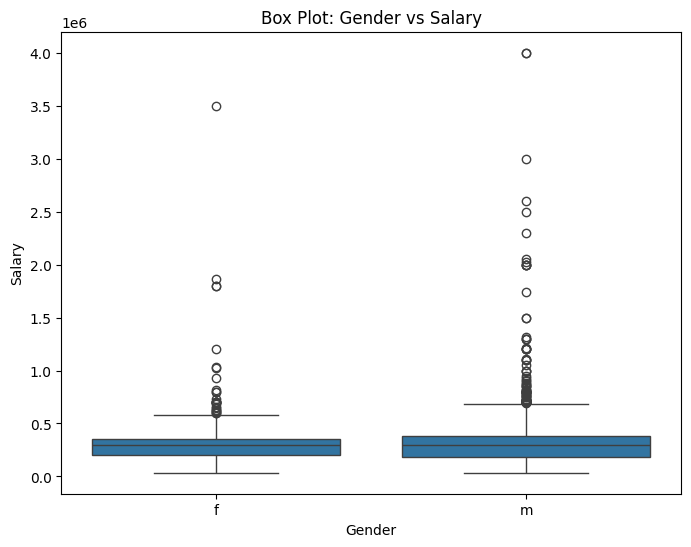

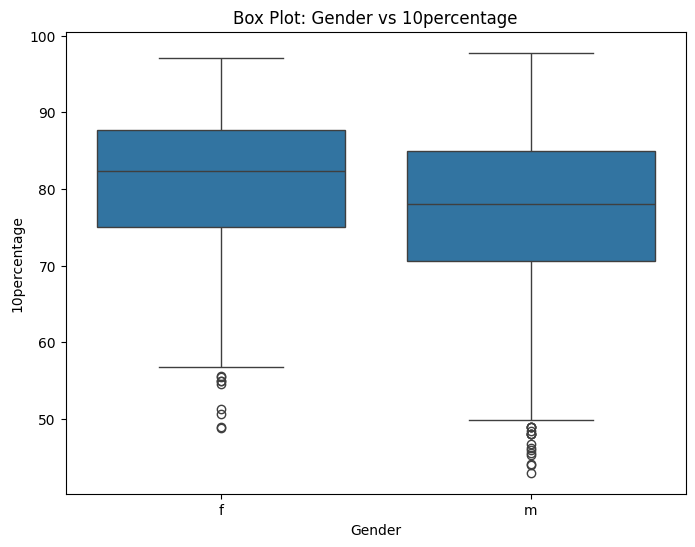

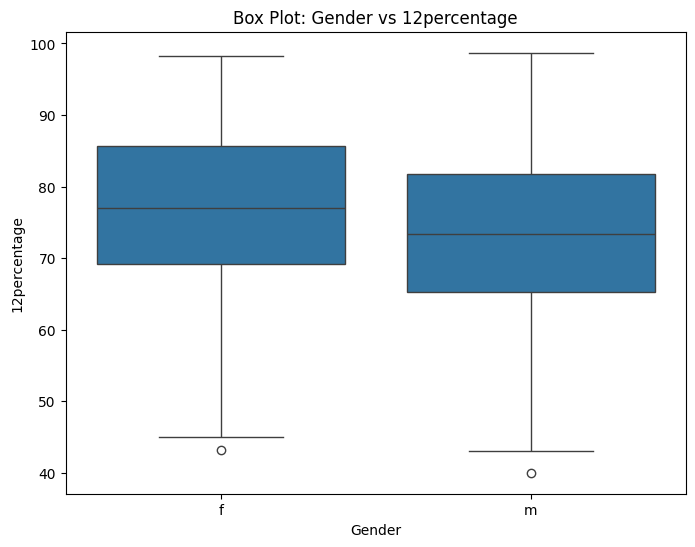

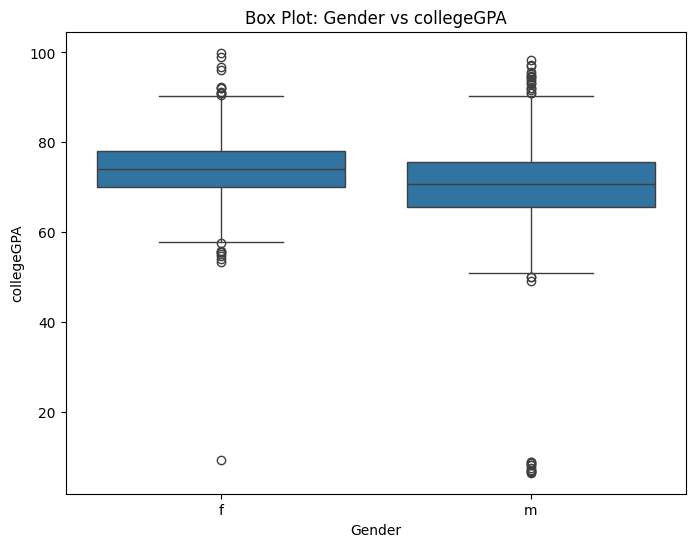

In [ ]:
#Gender vs
import warnings
warnings.filterwarnings('ignore')

categorical_columns = ['Gender']
numerical_columns = ['Salary','10percentage','12percentage','collegeGPA']

for cat_col in categorical_columns:
    for num_col in numerical_columns:
        plt.figure(figsize=(8, 6))
        sns.boxplot(x=cat_col, y=num_col, data=df)
        plt.title(f'Box Plot: {cat_col} vs {num_col}')
        plt.xlabel(cat_col)
        plt.ylabel(num_col)
        plt.show()

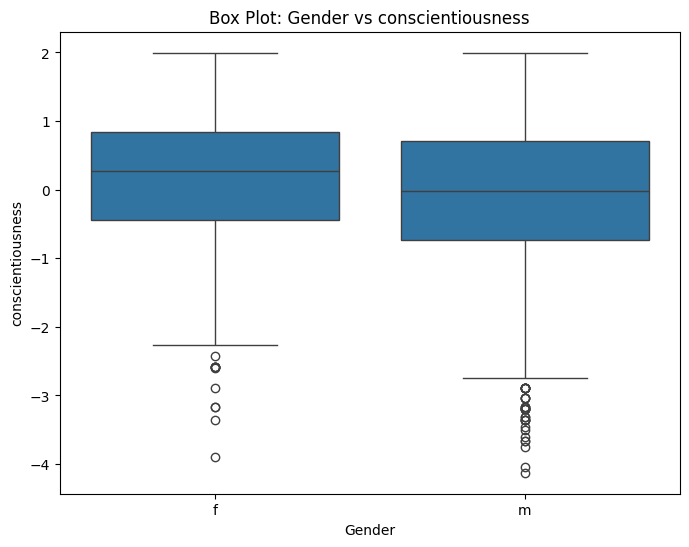

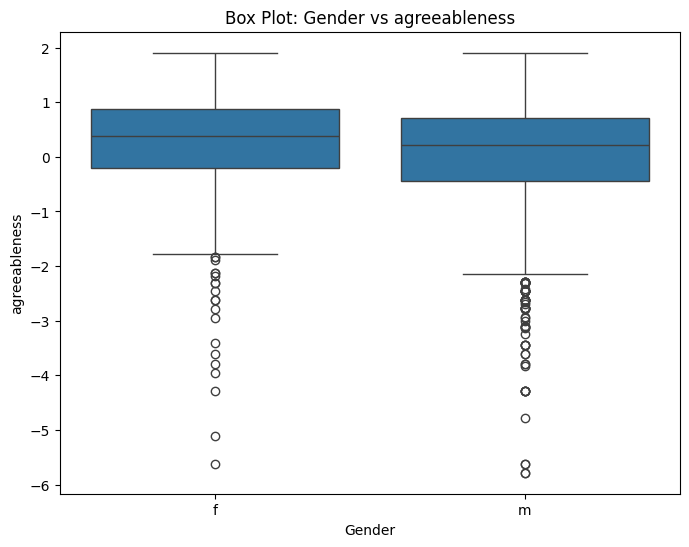

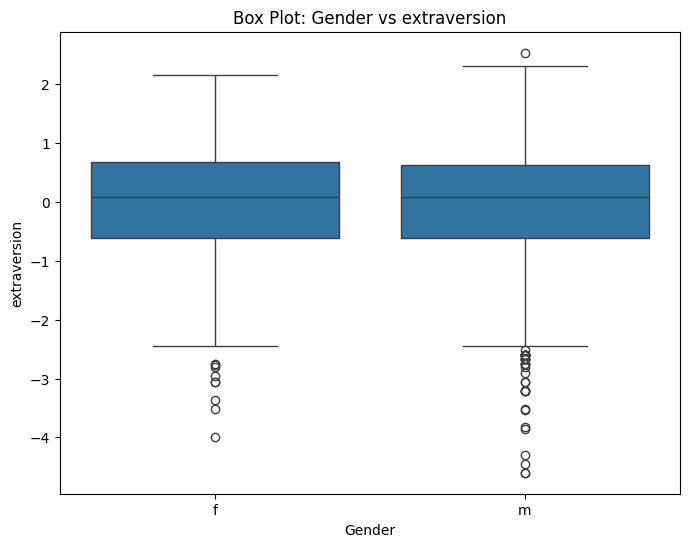

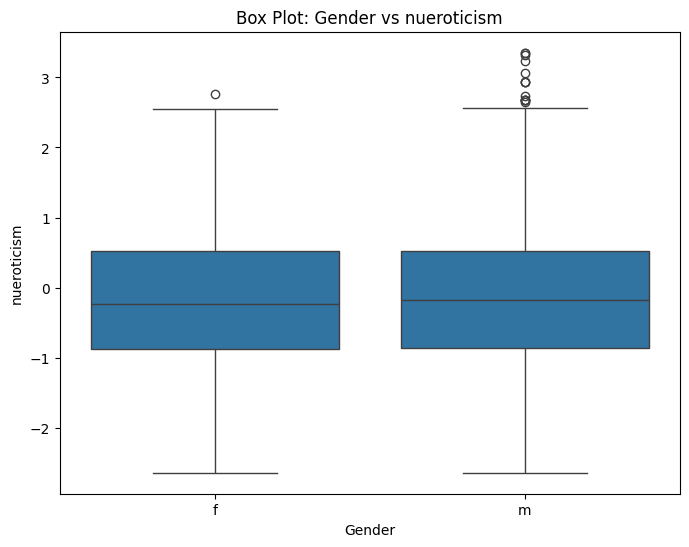

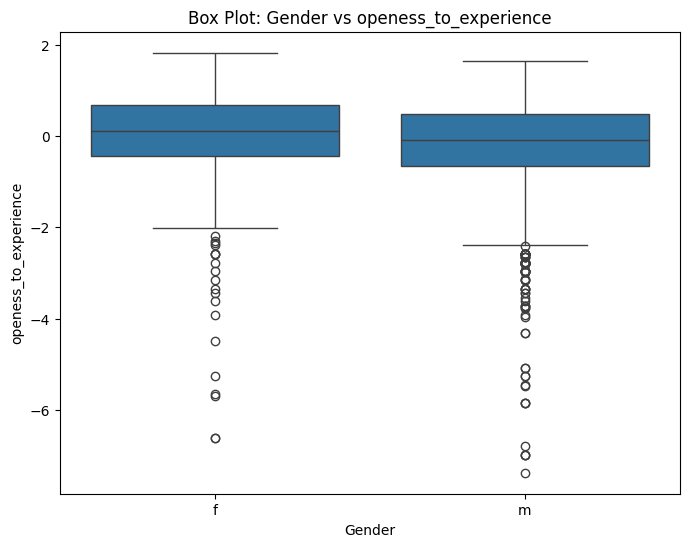

In [ ]:
#Gender vs
import warnings
warnings.filterwarnings('ignore')

categorical_columns = ['Gender']
numerical_columns = ['conscientiousness', 'agreeableness', 'extraversion',
       'nueroticism', 'openess_to_experience']

for cat_col in categorical_columns:
    for num_col in numerical_columns:
        plt.figure(figsize=(8, 6))
        sns.boxplot(x=cat_col, y=num_col, data=df)
        plt.title(f'Box Plot: {cat_col} vs {num_col}')
        plt.xlabel(cat_col)
        plt.ylabel(num_col)
        plt.show()

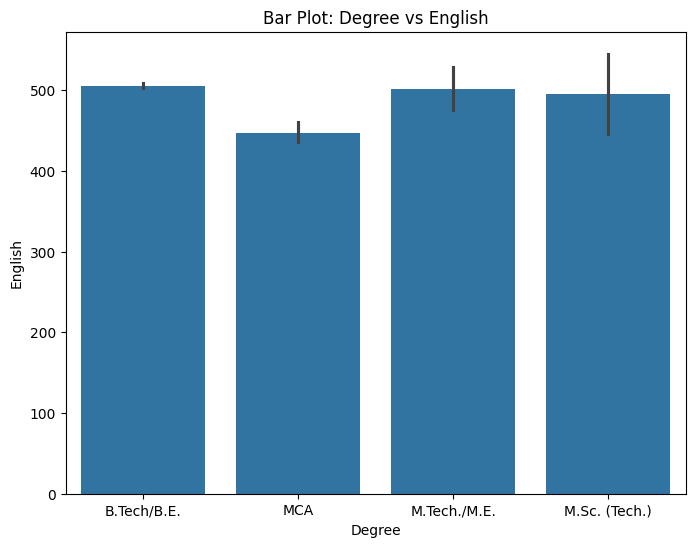

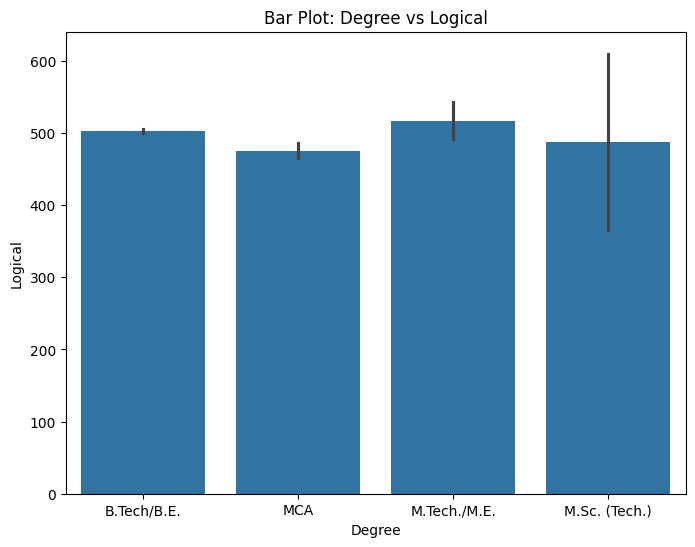

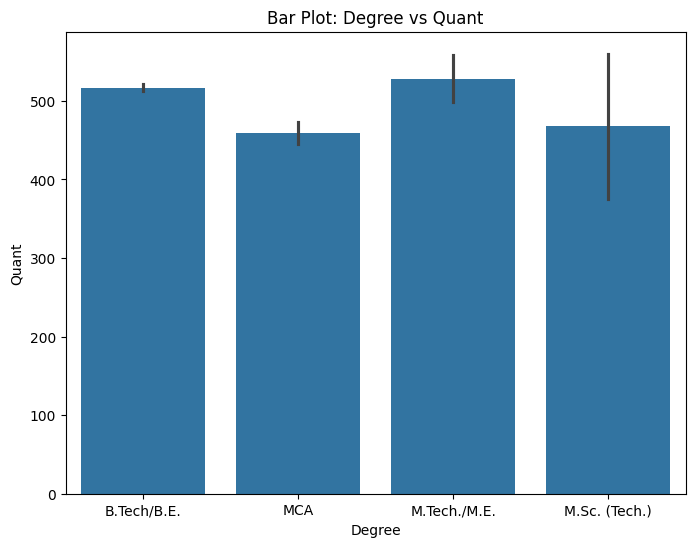

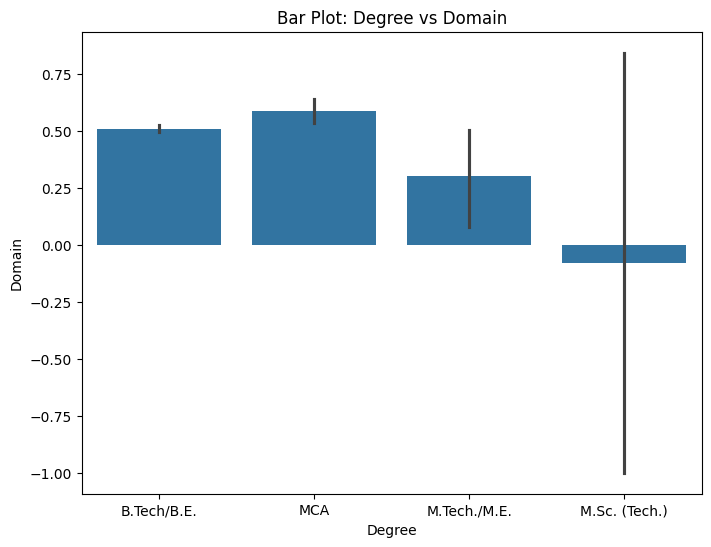

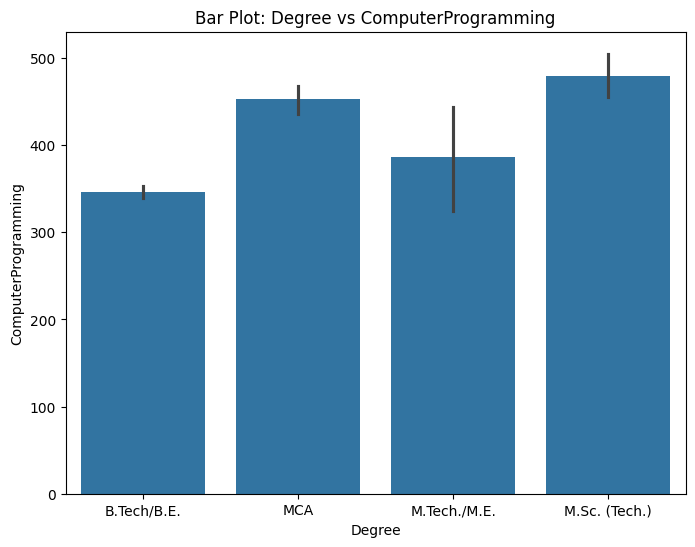

...

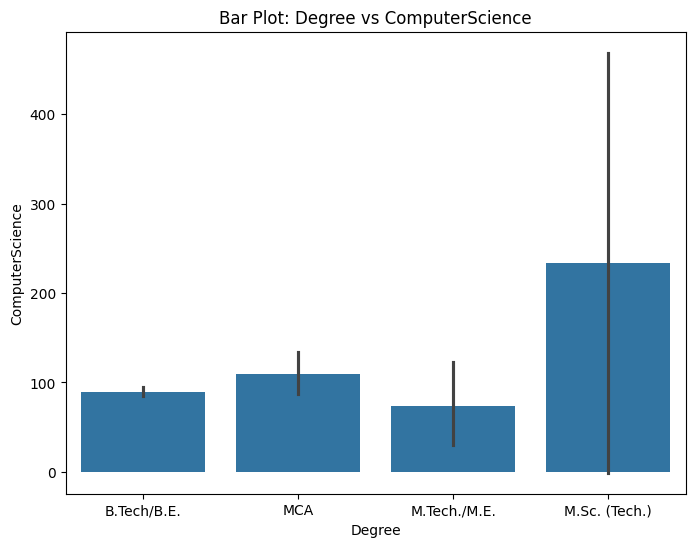

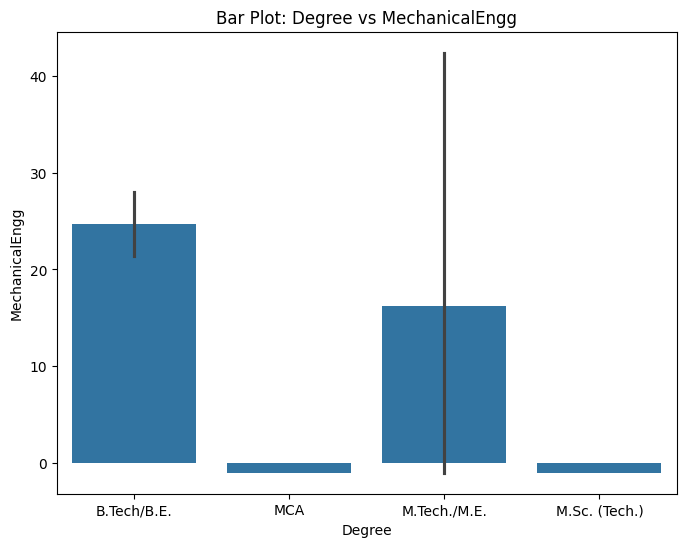

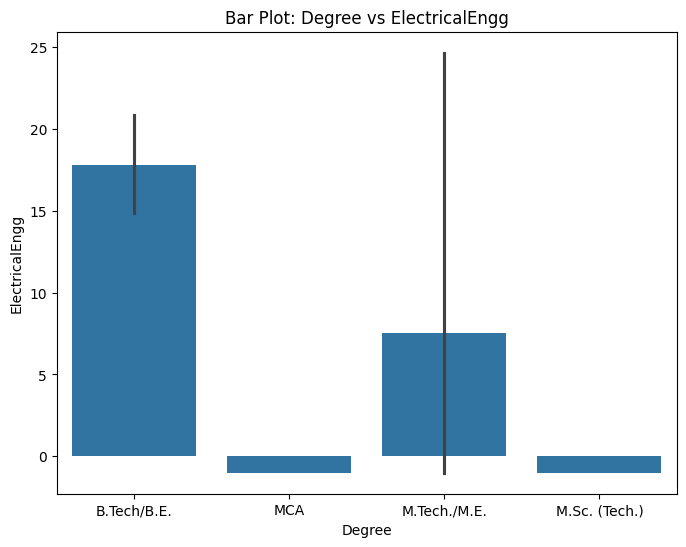

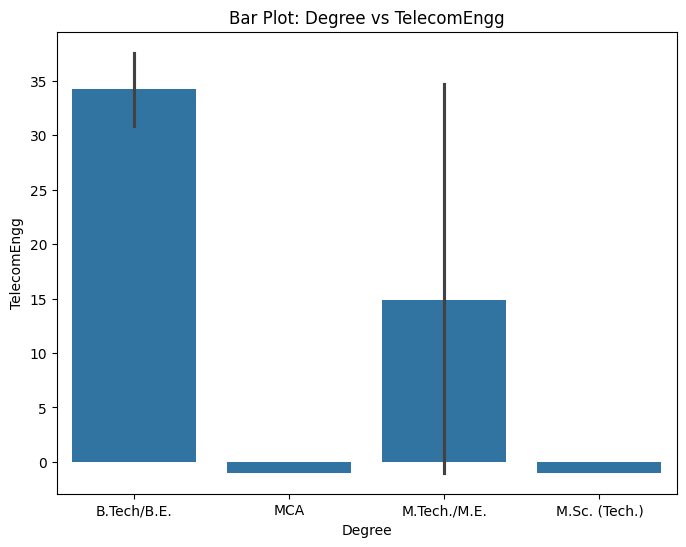

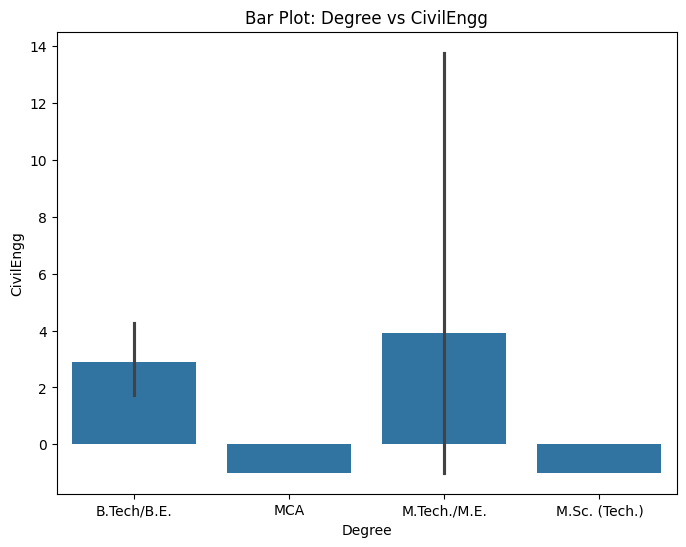

In [ ]:
#Bar Plot
import warnings
warnings.filterwarnings('ignore')
categorical_columns = ['Degree']
numerical_columns = ['English', 'Logical', 'Quant',
       'Domain', 'ComputerProgramming', 'ElectronicsAndSemicon',
       'ComputerScience', 'MechanicalEngg', 'ElectricalEngg', 'TelecomEngg',
       'CivilEngg']

for cat_col in categorical_columns:
    for num_col in numerical_columns:
        plt.figure(figsize=(8, 6))
        sns.barplot(x=cat_col, y=num_col, data=df)
        plt.title(f'Bar Plot: {cat_col} vs {num_col}')
        plt.xlabel(cat_col)
        plt.ylabel(num_col)
        plt.show()

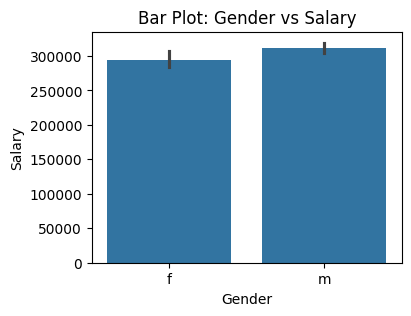

In [ ]:
#Bar Plot
import warnings
warnings.filterwarnings('ignore')
categorical_columns = ['Gender']
numerical_columns = ['Salary']

for cat_col in categorical_columns:
    for num_col in numerical_columns:
        plt.figure(figsize=(4, 3))
        sns.barplot(x=cat_col, y=num_col, data=df)
        plt.title(f'Bar Plot: {cat_col} vs {num_col}')
        plt.xlabel(cat_col)
        plt.ylabel(num_col)
        plt.show()

In [ ]:
# categorical vs categorical

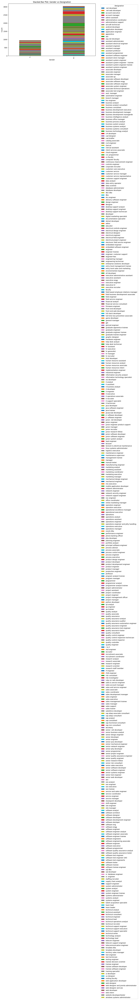

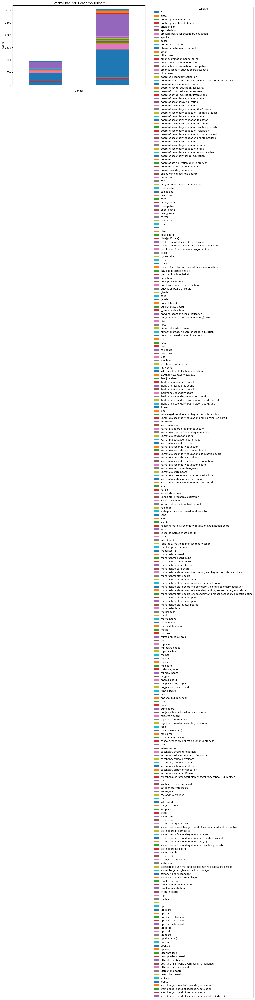

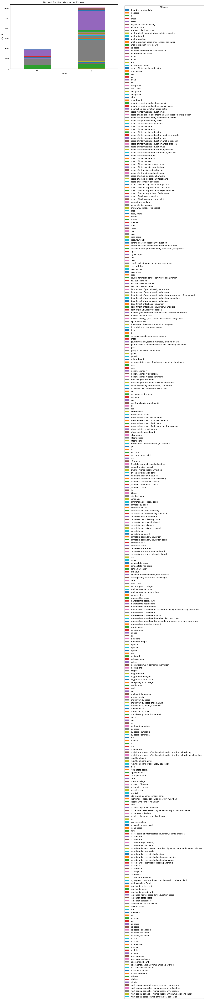

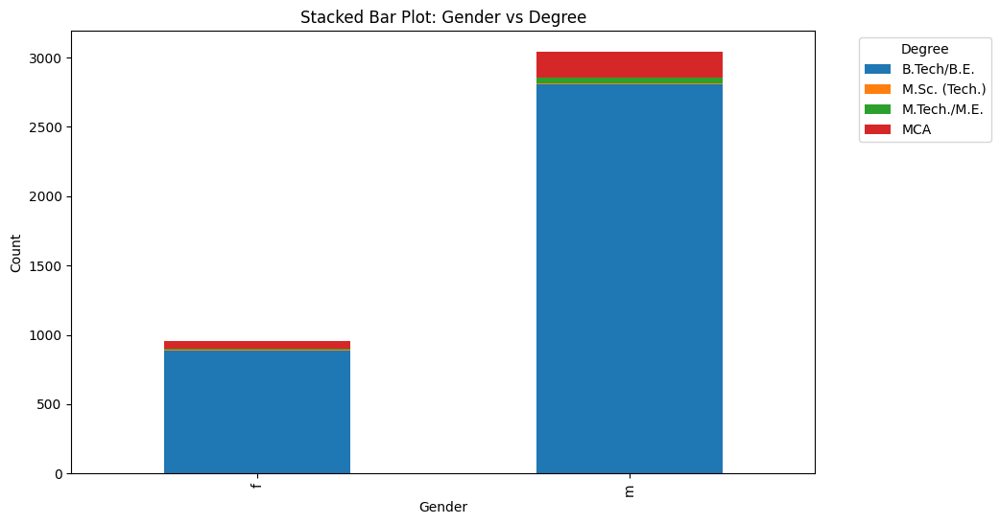

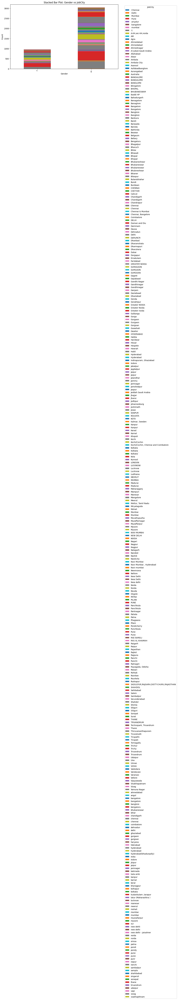

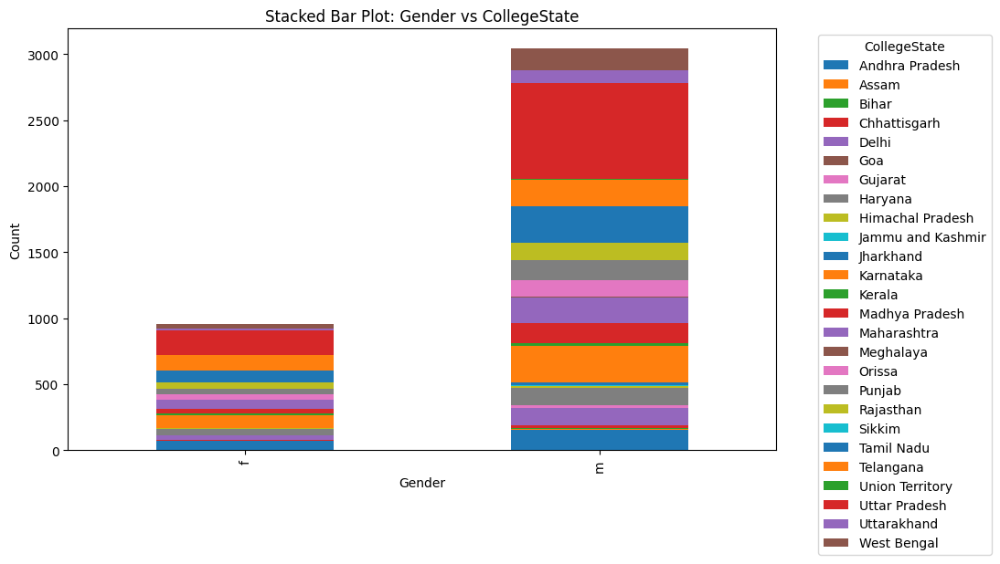

In [ ]:
cat_col1 = ['Gender']
cat_col2 = ['Designation', '10board','12board','Degree','JobCity','CollegeState']
for col1 in cat_col1:
    for col2 in cat_col2:
        # Cross-tabulate the values
        cross_tab = pd.crosstab(df[col1], df[col2])

        # Plot stacked bar plot
        cross_tab.plot(kind='bar', stacked=True, figsize=(10,6))
        plt.title(f'Stacked Bar Plot: {col1} vs {col2}')
        plt.xlabel(col1)
        plt.ylabel('Count')
        plt.xticks(rotation=90)
        plt.legend(title=col2, bbox_to_anchor=(1.05, 1), loc='upper left')
        plt.show()

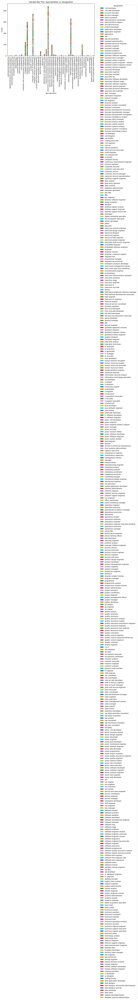

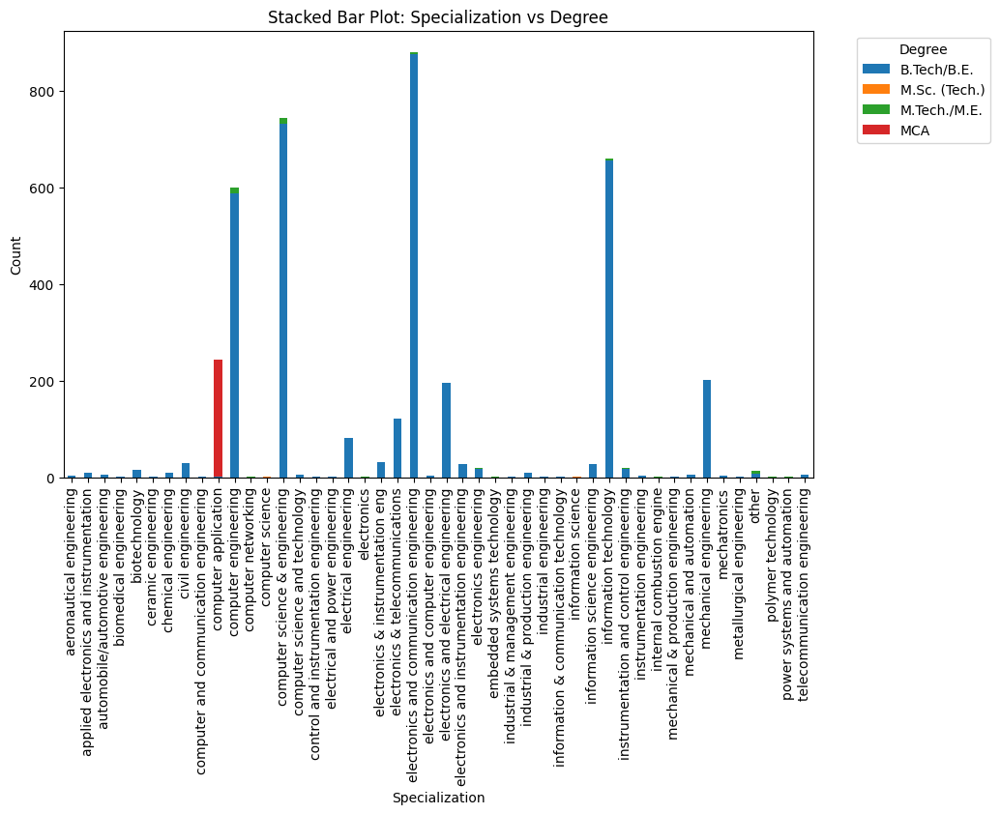

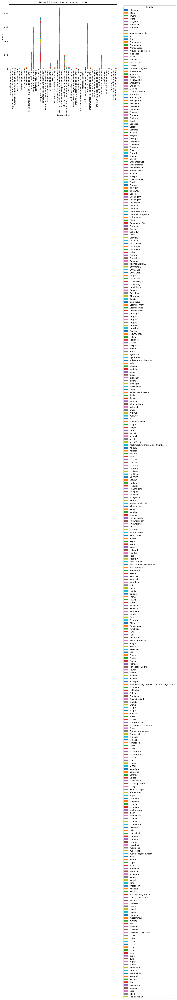

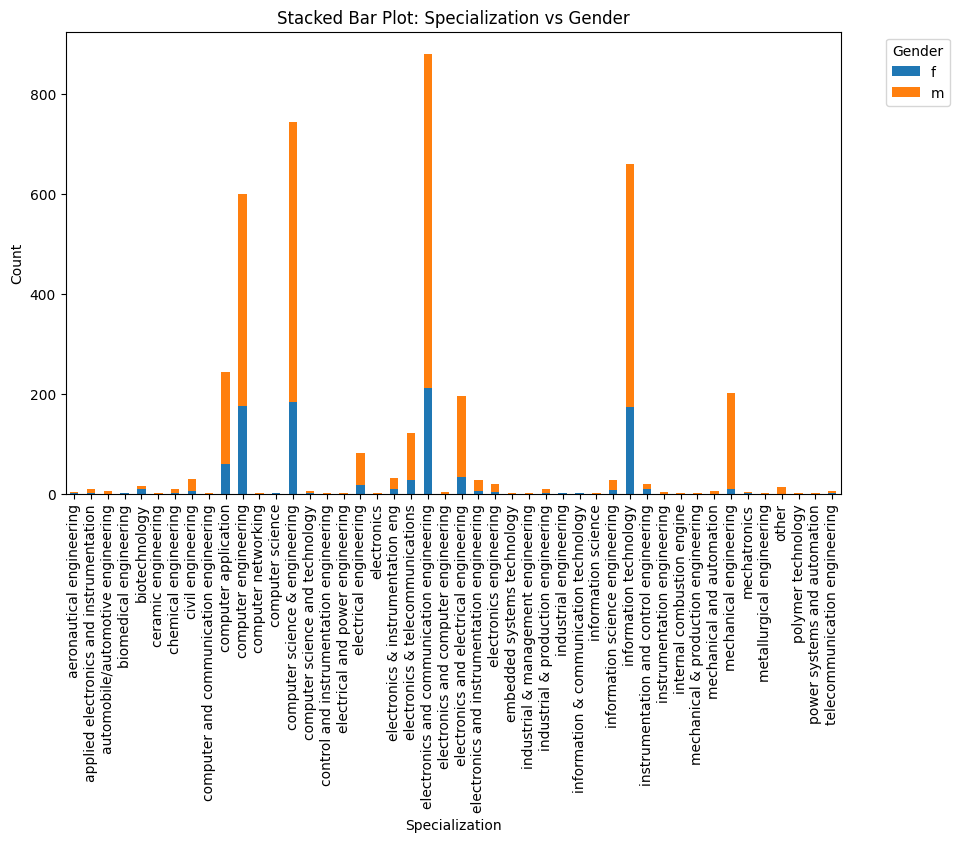

In [ ]:
cat_col1 = ['Specialization']
cat_col2 = ['Designation','Degree','JobCity','Gender']
for col1 in cat_col1:
    for col2 in cat_col2:
        # Cross-tabulate the values
        cross_tab = pd.crosstab(df[col1], df[col2])

        # Plot stacked bar plot
        cross_tab.plot(kind='bar', stacked=True, figsize=(10,6))
        plt.title(f'Stacked Bar Plot: {col1} vs {col2}')
        plt.xlabel(col1)
        plt.ylabel('Count')
        plt.xticks(rotation=90)
        plt.legend(title=col2, bbox_to_anchor=(1.05, 1), loc='upper left')
        plt.show()

The stacked bar plot is showing variation between specialization and designation, degree, jobcity, gender. It shows that how much count is their in  the specific specialization to the designation. Specialization vs Degree is showing the count with degree chossen by candidates. Specialization vs job city is counted quite big as job city destination are all over the world and there are numerous people who are working out of india too. Specialization vs gender is showing that the male is having a high ratio of specializations in every field as compared to female.

In [ ]:
#Times of India article dated Jan 18, 2019 states that “After doing your Computer Science Engineering if you take up jobs as a Programming Analyst, Software Engineer, Hardware Engineer and Associate Engineer you can earn up to 2.5-3 lakhs as a fresh graduate.” Test this claim with the data given to you.

In [ ]:
# Get unique specialization fields
specializations = df['Specialization'].unique()

print("Unique Specialization Fields:")
for specialization in specializations:
    print(specialization)

Unique Specialization Fields:
computer engineering
electronics and communication engineering
information technology
computer science & engineering
mechanical engineering
electronics and electrical engineering
electronics & telecommunications
instrumentation and control engineering
computer application
electronics and computer engineering
electrical engineering
applied electronics and instrumentation
electronics & instrumentation eng
information science engineering
civil engineering
mechanical and automation
industrial & production engineering
control and instrumentation engineering
metallurgical engineering
electronics and instrumentation engineering
electronics engineering
ceramic engineering
chemical engineering
aeronautical engineering
other
biotechnology
embedded systems technology
electrical and power engineering
computer science and technology
mechatronics
automobile/automotive engineering
polymer technology
mechanical & production engineering
power systems and automation
instrum

In [ ]:
# List of specialization fields to replace
specializations_to_replace = [
    'computer engineering', 'information technology', 'computer science & engineering',
    'computer application', 'electronics and computer engineering', 'information science engineering',
    'computer science and technology', 'computer and communication engineering',
    'information & communication technology', 'information science', 'computer networking', 'computer science'
]
df['Specialization'].replace(specializations_to_replace, 'computer science and engineering', inplace=True)
# Verify the replacements
specializations_after_replacement = df['Specialization'].unique()
print("Unique Specialization Fields after Replacement:")
for specializations in specializations_after_replacement:
    print(specializations)
# Count occurrences of each specialization after replacement

specialization_counts_after_replacement = df['Specialization'].value_counts()

print("Specialization Counts after Replacement:")
print(specialization_counts_after_replacement)


Unique Specialization Fields after Replacement:
computer science and engineering
electronics and communication engineering
mechanical engineering
electronics and electrical engineering
electronics & telecommunications
instrumentation and control engineering
electrical engineering
applied electronics and instrumentation
electronics & instrumentation eng
civil engineering
mechanical and automation
industrial & production engineering
control and instrumentation engineering
metallurgical engineering
electronics and instrumentation engineering
electronics engineering
ceramic engineering
chemical engineering
aeronautical engineering
other
biotechnology
embedded systems technology
electrical and power engineering
mechatronics
automobile/automotive engineering
polymer technology
mechanical & production engineering
power systems and automation
instrumentation engineering
telecommunication engineering
industrial & management engineering
industrial engineering
internal combustion engine
biomedica

In [ ]:
# Get unique specialization fields
designations = df['Designation'].unique()

print("Unique designation Fields:")
for designation in designations:
    print(designation)


Unique designation Fields:
senior quality engineer
assistant manager
systems engineer
senior software engineer
get
system engineer
java software engineer
mechanical engineer
electrical engineer
project engineer
senior php developer
senior systems engineer
quality assurance engineer
qa analyst
network engineer
product development engineer
associate software developer
data entry operator
software engineer
developer
electrical project engineer
programmer analyst
systems analyst
ase
telecommunication engineer
application developer
ios developer
executive assistant
online marketing manager
documentation specialist
associate software engineer
management trainee
site manager
software developer
.net developer
production engineer
jr. software engineer
trainee software developer
ui developer
assistant system engineer
android developer
customer service
test engineer
java developer
engineer
recruitment coordinator
technical support engineer
data analyst
assistant software engineer
faculty
entry le

In [ ]:
# Define the specific designation names
specified_job_roles = ['Programmer Analyst','Software Engineer', 'Hardware Engineer', 'Associate Engineer']
designation_counts = {role: 0 for role in specified_job_roles}
for role in specified_job_roles:
    designation_counts[role] += df[df['Designation'].str.lower().str.contains(role.lower())].shape[0]
print("Counts of each specific designation:")
for role, count in designation_counts.items():
    print(f"{role}: {count}")
total_count = sum(designation_counts.values())
print(f"\nTotal count of data: {total_count}")


Counts of each specific designation:
Programmer Analyst: 144
Software Engineer: 816
Hardware Engineer: 8
Associate Engineer: 6

Total count of data: 974


In [ ]:
from scipy import stats
warnings.filterwarnings('ignore')
"""
specializations_to_replace = [
    'computer engineering', 'information technology', 'computer science & engineering',
    'computer application', 'electronics and computer engineering', 'information science engineering',
    'computer science and technology', 'computer and communication engineering',
    'information & communication technology', 'information science', 'computer networking', 'computer science'
]
df['Specialization'].replace(specializations_to_replace, 'computer science and engineering', inplace=True)
# Verify the replacements
specializations_after_replacement = df['Specialization'].unique()
print("Unique Specialization Fields after Replacement:")
for specializations in specializations_after_replacement:
    print(specializations)
specializations = list(specializations)

specified_job_roles = ['Programmer Analyst', 'Software Engineer', 'Hardware Engineer', 'Associate Engineer']

df_specified_roles = pd.DataFrame(specified_job_roles, columns=['Designation'])

print("DataFrame containing all specified job roles:")
print(df_specified_roles)

"""
# List of specialization fields
specified_specializations = ['computer science and engineering ']
print(specified_specializations)
# List of specific job roles
specified_job_roles = ['Programmer Analyst', 'Software Engineer', 'Hardware Engineer', 'Associate Engineer']
print(specified_job_roles)
# Filter the data based on the specified specialization fields and job roles
filtered_data = df[(df['Specialization'].isin(specified_specializations)) &
                   (df['Designation'].isin(specified_job_roles))]
print(filtered_data)
# Calculate the mean salary
sample_mean_salary = filtered_data['Salary'].mean()

# Claimed salary range
claimed_salary_range = (2.5, 3)  # in lakhs

# Perform one-sample t-test
t_statistic, p_value = stats.ttest_1samp(filtered_data['Salary'], claimed_salary_range[0])

# Compute degrees of freedom
degrees_of_freedom = len(filtered_data) - 1

# Calculate critical t-value at alpha = 0.05 and df = degrees_of_freedom
critical_t_value = stats.t.ppf(1 - 0.05, degrees_of_freedom)

# Print results
print(f"Sample mean salary: {sample_mean_salary:.2f} lakhs")
print(f"Critical t-value at alpha = 0.05: {critical_t_value:.2f}")
print(f"P-value: {p_value:.4f}")

if p_value < 0.05 and sample_mean_salary > claimed_salary_range[0]:
    print("Reject the null hypothesis. There is enough evidence to support the claim.")
else:
    print("Fail to reject the null hypothesis. Insufficient evidence to support the claim.")


['computer science and engineering ']
['Programmer Analyst', 'Software Engineer', 'Hardware Engineer', 'Associate Engineer']
Empty DataFrame
Columns: [Unnamed: 0, ID, Salary, DOJ, DOL, Designation, JobCity, Gender, DOB, 10percentage, 10board, 12graduation, 12percentage, 12board, CollegeID, CollegeTier, Degree, Specialization, collegeGPA, CollegeCityID, CollegeCityTier, CollegeState, GraduationYear, English, Logical, Quant, Domain, ComputerProgramming, ElectronicsAndSemicon, ComputerScience, MechanicalEngg, ElectricalEngg, TelecomEngg, CivilEngg, conscientiousness, agreeableness, extraversion, nueroticism, openess_to_experience]
Index: []

[0 rows x 39 columns]
Sample mean salary: nan lakhs
Critical t-value at alpha = 0.05: nan
P-value: nan
Fail to reject the null hypothesis. Insufficient evidence to support the claim.


The claim is supported by the data for the following roles:
Designation
Application Engineer                 278125.000000
Assistant Professor                  258333.333333
Associate Software Developer         256666.666667
Business Analyst                     299285.714286
Business Analyst Consultant          296250.000000
Business Development Executive       300000.000000
Business Systems Analyst             275000.000000
Engineer                             275000.000000
Engineer Trainee                     300000.000000
Executive Hr                         300000.000000
Executive Recruiter                  280000.000000
Front End Developer                  263333.333333
Front End Web Developer              250000.000000
Game Developer                       300000.000000
Graduate Engineer Trainee            281250.000000
Hr Generalist                        270000.000000
Html Developer                       270000.000000
Information Technology Specialist    280000.000000
Ios Develo

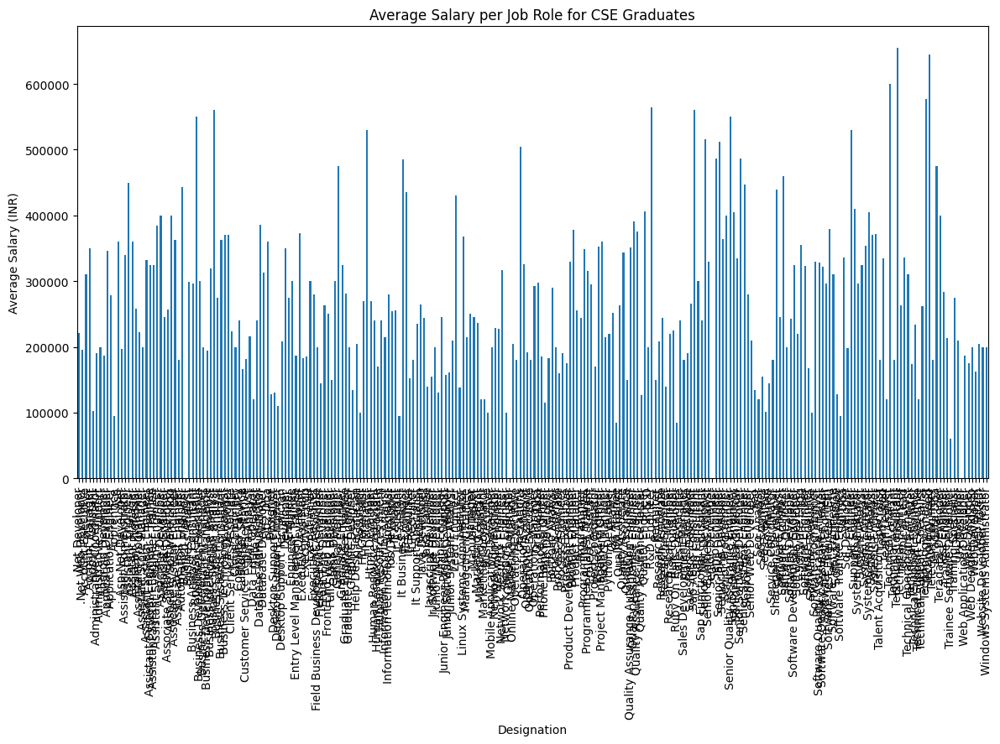

In [ ]:
warnings.filterwarnings('ignore')
# Filter data for Computer Science Engineering (CSE) graduates
cse_graduates = df[df['Specialization'].str.contains('computer ', case=True)]

# Standardize job roles mentioned in the claim
target_job_roles = ['Programming Analyst', 'Software Engineer', 'Hardware Engineer', 'Associate Engineer']

# Replace misspelled or variations of job roles with standardized names
cse_graduates.loc[:, 'Designation'] = cse_graduates['Designation'].apply(lambda x: x.title())
cse_graduates.loc[:, 'Designation'] = cse_graduates['Designation'].apply(lambda x: next((role for role in target_job_roles if role.lower() in x.lower()), x))

# Calculate average salary for each job role
average_salary_per_role = cse_graduates.groupby('Designation')['Salary'].mean()

# Compare with the claim
claim_range = (250000, 300000)
within_claim_range = average_salary_per_role.between(claim_range[0], claim_range[1])
if within_claim_range.any():
    print("The claim is supported by the data for the following roles:")
    print(average_salary_per_role[within_claim_range])
else:
    print("The claim is not supported by the data.")

# Optional: You can also visualize the average salaries for each job role.
import matplotlib.pyplot as plt
average_salary_per_role.plot(kind='bar', title='Average Salary per Job Role for CSE Graduates', figsize=(14, 7))
plt.ylabel('Average Salary (INR)')
plt.xticks(rotation=90)
plt.show()

The above plot is showing the average salary of employeer as per their designation. The highest Average salary stat is above 60000 and the lowest is below 10000.

In [ ]:
#Is there a relationship between gender and specialization? (i.e. Does the preference of Specialisation depend on the Gender?)

In [ ]:
gender_specialization_freq = pd.crosstab(df['Gender'], df['Specialization'])

In [ ]:
from scipy.stats import chi2_contingency
chi2, p, dof, expected = chi2_contingency(gender_specialization_freq)

In [ ]:
alpha = 0.05
if p < alpha:
    print("There is a significant association between gender and specialization preference.")
else:
    print("There is no significant association between gender and specialization preference.")

There is a significant association between gender and specialization preference.


In [ ]:
#Are there correlations between specific personality traits and performance in technical assessments

selected_columns = ['conscientiousness', 'agreeableness', 'extraversion', 'nueroticism',
                    'openess_to_experience', 'English', 'Logical', 'Quant', 'Domain',
                    'ComputerProgramming']

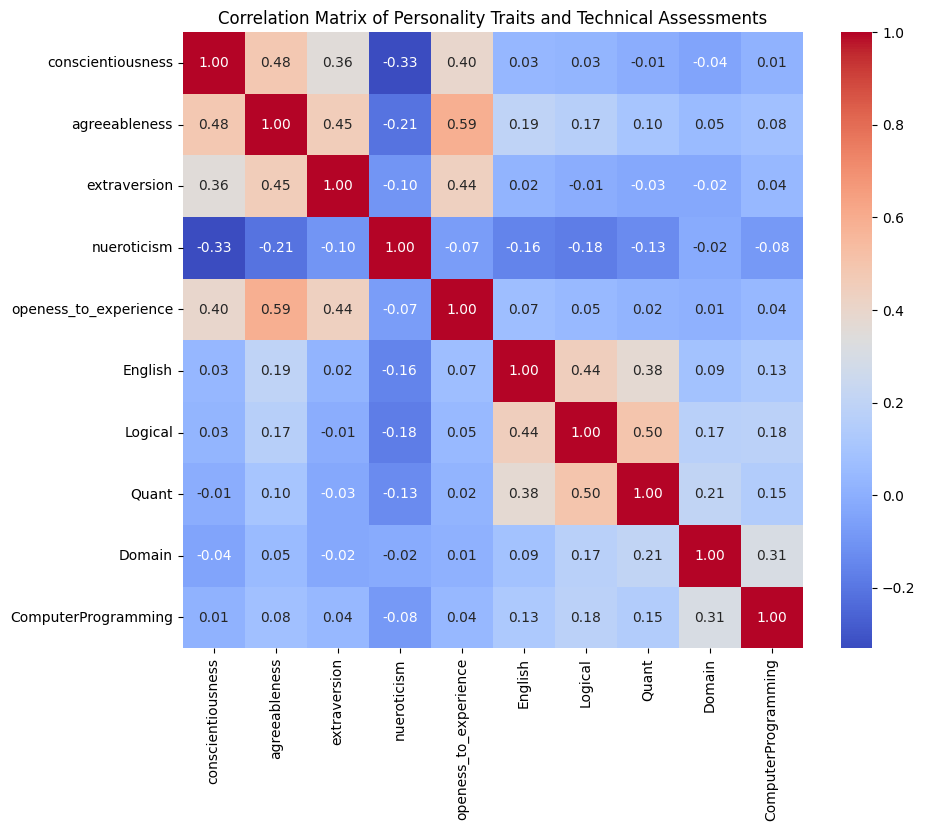

In [ ]:
subset_data = df[selected_columns]

# Compute correlation matrix
correlation_matrix = subset_data.corr()

# Visualize the correlation matrix using a heatmap
plt.figure(figsize=(10, 8))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f")
plt.title('Correlation Matrix of Personality Traits and Technical Assessments')
plt.show()

The correlation matrix of personality traits and technical assessment. From this graph we get to know that range of candidates who are good and bad in both in one what is the impact of personality traits and technical assessment to each other. If we see the plot carefully we can see that nueroticism is having the lowest no. as in -33 and everyone is having 1 range with each other. The second highest is 0.59 which is between agreeableness and openess to experience.
Because of the above matrix we can see that the their is much need to improvement among candidates for personality traits and personal assessment.

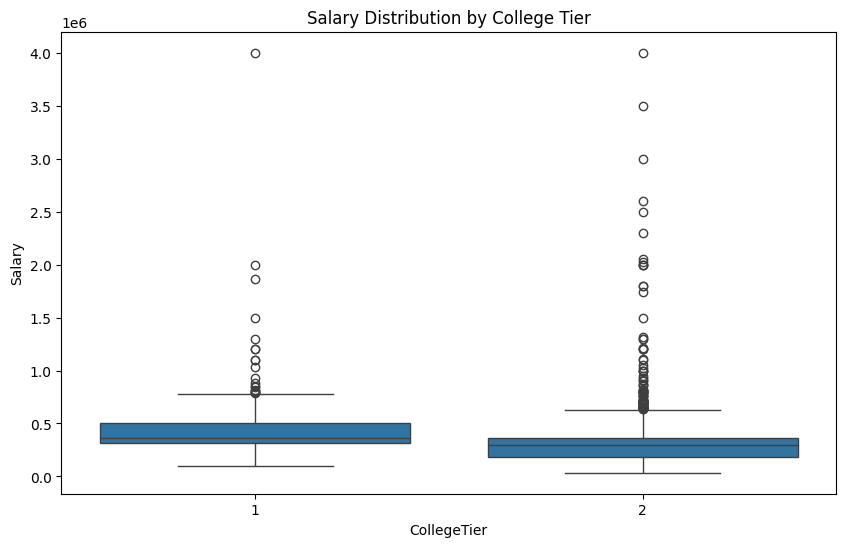

Mean Salary by College Tier:
 CollegeCityTier  CollegeState       CollegeTier
0                Andhra Pradesh     1              3.200000e+05
                                    2              3.245089e+05
                 Assam              1              5.333333e+05
                                    2              3.300000e+05
                 Bihar              1              4.100000e+05
                                    2              1.640000e+05
                 Chhattisgarh       1              3.275000e+05
                                    2              2.502174e+05
                 Goa                2              4.500000e+05
                 Gujarat            1              4.550000e+05
                                    2              3.325000e+05
                 Haryana            1              3.613333e+05
                                    2              2.943333e+05
                 Himachal Pradesh   1              3.400000e+05
                          

In [ ]:
#Does the location (state, city tier) and reputation (College Tier, College State) of the candidate's college influence their career outcomes (salary, job placement)?

from scipy.stats import ttest_ind

# Descriptive Analysis
summary_stats = df.groupby(['CollegeCityTier', 'CollegeState', 'CollegeTier']).agg({'Salary': 'mean'})

# Statistical Testing
tier1_salaries = df[df['CollegeTier'] == 1]['Salary']
tier2_salaries = df[df['CollegeTier'] == 2]['Salary']
t_stat, p_value = ttest_ind(tier1_salaries, tier2_salaries)

# Visualization
plt.figure(figsize=(10, 6))
sns.boxplot(x='CollegeTier', y='Salary', data=df)
plt.title('Salary Distribution by College Tier')
plt.show()

# Interpretation
print("Mean Salary by College Tier:\n", summary_stats['Salary'])
print("T-test p-value:", p_value)
